In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


from collections import defaultdict
from wordcloud import STOPWORDS
import string

import ast
import re

import fasttext
import operator
import unicodedata
from collections import Counter

from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.manifold import TSNE
from sklearn.preprocessing import normalize
from sklearn.cluster import KMeans

plt.style.use("seaborn-v0_8-white")

# Product Data Reading

In [2]:
product_df = pd.read_csv("D:/MachineLearning/Kaggle/data/Sephora/product_info.csv")
product_df.head()

,product_id,product_name,brand_id,brand_name,loves_count,rating,reviews,size,variation_type,variation_value,...,online_only,out_of_stock,sephora_exclusive,highlights,primary_category,secondary_category,tertiary_category,child_count,child_max_price,child_min_price
0,P473671,Fragrance Discovery Set,6342,19-69,6320,3.6364,11.0,NaN,NaN,NaN,...,1,0,0,"['Unisex/ Genderless Scent', 'Warm &Spicy Scen...",Fragrance,Value & Gift Sets,Perfume Gift Sets,0,NaN,NaN
1,P473668,La Habana Eau de Parfum,6342,19-69,3827,4.1538,13.0,3.4 oz/ 100 mL,Size + Concentration + Formulation,3.4 oz/ 100 mL,...,1,0,0,"['Unisex/ Genderless Scent', 'Layerable Scent'...",Fragrance,Women,Perfume,2,85.0,30.0
2,P473662,Rainbow Bar Eau de Parfum,6342,19-69,3253,4.2500,16.0,3.4 oz/ 100 mL,Size + Concentration + Formulation,3.4 oz/ 100 mL,...,1,0,0,"['Unisex/ Genderless Scent', 'Layerable Scent'...",Fragrance,Women,Perfume,2,75.0,30.0
3,P473660,Kasbah Eau de Parfum,6342,19-69,3018,4.4762,21.0,3.4 oz/ 100 mL,Size + Concentration + Formulation,3.4 oz/ 100 mL,...,1,0,0,"['Unisex/ Genderless Scent', 'Layerable Scent'...",Fragrance,Women,Perfume,2,75.0,30.0
4,P473658,Purple Haze Eau de Parfum,6342,19-69,2691,3.2308,13.0,3.4 oz/ 100 mL,Size + Concentration + Formulation,3.4 oz/ 100 mL,...,1,0,0,"['Unisex/ Genderless Scent', 'Layerable Scent'...",Fragrance,Women,Perfume,2,75.0,30.0


# Review Data Reading

## Column Type Inconsistency

In [3]:
def column_type_check(df): # data frame
    print('Columns that have multiple data types: ')

    for column in df.columns:
        if len(df[column].apply(type).value_counts()) >= 2:
            print(' ', column)

### First partial review dataset

In [4]:
review_df_1 = pd.read_csv("D:/MachineLearning/Kaggle/data/Sephora/reviews_0-250.csv", index_col=0)
column_type_check(review_df_1)

C:\Users\fuyuz\AppData\Local\Temp\ipykernel_24772\3362949290.py:1: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  review_df_1 = pd.read_csv("D:/MachineLearning/Kaggle/data/Sephora/reviews_0-250.csv", index_col=0)


Columns that have multiple data types: 
  author_id
  review_text
  review_title
  skin_tone
  eye_color
  skin_type
  hair_color


In [5]:
#author_id
mask = (review_df_1.loc[:,'author_id'] == 'dummyUser')
review_df_1.loc[mask,'author_id'] = 1

mask = review_df_1.iloc[:,0].apply(lambda x: isinstance(x, str)) 
a = review_df_1[mask]
mask_idx = a[a.loc[:,'author_id'].str.contains(r'order', regex=False)].index # for the str 'order...'

unique_id = review_df_1.loc[mask_idx, 'author_id'].unique()
author_id_mapping = {old: new_id for new_id, old in enumerate(unique_id, start= 2)}

review_df_1.loc[mask_idx, 'author_id'] = review_df_1.loc[mask_idx, 'author_id'].map(author_id_mapping).astype(int)

review_df_1['author_id'] = review_df_1['author_id'].astype(int)

#review_text
mask = review_df_1.iloc[:,8].apply(lambda x: isinstance(x, float))
review_df_1.loc[mask,'review_text'] = 'No_review'

#review_title
mask = review_df_1.iloc[:,9].apply(lambda x: isinstance(x, float))
review_df_1.loc[mask,'review_title'] = 'No_review_title'

#skin_tone
mask = review_df_1.iloc[:,10].apply(lambda x: isinstance(x, float))
review_df_1.loc[mask,'skin_tone'] = 'No_profile'

#eye_color
mask = review_df_1.iloc[:,11].apply(lambda x: isinstance(x, float))
review_df_1.loc[mask,'eye_color'] = 'No_profile'

#skin_type
mask = review_df_1.iloc[:,12].apply(lambda x: isinstance(x, float))
review_df_1.loc[mask,'skin_type'] = 'No_profile'

#hair_color
mask = review_df_1.iloc[:,13].apply(lambda x: isinstance(x, float))
review_df_1.loc[mask,'hair_color'] = 'No_profile'

### Second partial review dataset

In [6]:
review_df_2 = pd.read_csv("D:/MachineLearning/Kaggle/data/Sephora/reviews_250-500.csv", index_col=0)
column_type_check(review_df_2)

Columns that have multiple data types: 
  review_text
  review_title
  skin_tone
  eye_color
  skin_type
  hair_color


In [7]:
# author_id
check_idx = np.isin(review_df_2.loc[~ review_df_2['author_id'].str.isnumeric(), 'author_id'].unique(), 
        list(author_id_mapping.keys()))

print('author_id: ', check_idx)

to_be_added = review_df_2.loc[~ review_df_2['author_id'].str.isnumeric(), 'author_id'].unique()[~check_idx]

author_id_mapping_conca = {old: new_id for new_id, old in enumerate(to_be_added, start= 17)}

author_id_mapping = author_id_mapping | author_id_mapping_conca

review_df_2.loc[~ review_df_2['author_id'].str.isnumeric(), 'author_id'] = (
    review_df_2.loc[~ review_df_2['author_id'].str.isnumeric(), 'author_id'].map(author_id_mapping).astype(int)
)

review_df_2['author_id'] = review_df_2['author_id'].astype(int)

author_id:  [ True  True  True False  True False  True]


In [8]:
#review_text
mask = review_df_2.iloc[:,8].apply(lambda x: isinstance(x, float))
review_df_2.loc[mask,'review_text'] = 'No_review'

#review_title
mask = review_df_2.iloc[:,9].apply(lambda x: isinstance(x, float))
review_df_2.loc[mask,'review_title'] = 'No_review_title'

#skin_tone
mask = review_df_2.iloc[:,10].apply(lambda x: isinstance(x, float))
review_df_2.loc[mask,'skin_tone'] = 'No_profile'

#eye_color
mask = review_df_2.iloc[:,11].apply(lambda x: isinstance(x, float))
review_df_2.loc[mask,'eye_color'] = 'No_profile'

#skin_type
mask = review_df_2.iloc[:,12].apply(lambda x: isinstance(x, float))
review_df_2.loc[mask,'skin_type'] = 'No_profile'

#hair_color
mask = review_df_2.iloc[:,13].apply(lambda x: isinstance(x, float))
review_df_2.loc[mask,'hair_color'] = 'No_profile'

### Third partial review dataset

In [9]:
review_df_3 = pd.read_csv("D:/MachineLearning/Kaggle/data/Sephora/reviews_500-750.csv", index_col=0)
column_type_check(review_df_3)

Columns that have multiple data types: 
  review_text
  review_title
  skin_tone
  eye_color
  skin_type
  hair_color


In [10]:
# author_id
check_idx = np.isin(review_df_3.loc[~ review_df_3['author_id'].str.isnumeric(), 'author_id'].unique(), 
        list(author_id_mapping.keys()))

print('author_id: ', check_idx)

to_be_added = review_df_3.loc[~ review_df_3['author_id'].str.isnumeric(), 'author_id'].unique()[~check_idx]

author_id_mapping_conca = {old: new_id for new_id, old in enumerate(to_be_added, start= 19)}

author_id_mapping = author_id_mapping | author_id_mapping_conca

review_df_3.loc[~ review_df_3['author_id'].str.isnumeric(), 'author_id'] = (
    review_df_3.loc[~ review_df_3['author_id'].str.isnumeric(), 'author_id'].map(author_id_mapping).astype(int)
)

review_df_3['author_id'] = review_df_3['author_id'].astype(int)

author_id:  [ True False  True]


In [11]:
#review_text
mask = review_df_3.iloc[:,8].apply(lambda x: isinstance(x, float))
review_df_3.loc[mask,'review_text'] = 'No_review'

#review_title
mask = review_df_3.iloc[:,9].apply(lambda x: isinstance(x, float))
review_df_3.loc[mask,'review_title'] = 'No_review_title'

#skin_tone
mask = review_df_3.iloc[:,10].apply(lambda x: isinstance(x, float))
review_df_3.loc[mask,'skin_tone'] = 'No_profile'

#eye_color
mask = review_df_3.iloc[:,11].apply(lambda x: isinstance(x, float))
review_df_3.loc[mask,'eye_color'] = 'No_profile'

#skin_type
mask = review_df_3.iloc[:,12].apply(lambda x: isinstance(x, float))
review_df_3.loc[mask,'skin_type'] = 'No_profile'

#hair_color
mask = review_df_3.iloc[:,13].apply(lambda x: isinstance(x, float))
review_df_3.loc[mask,'hair_color'] = 'No_profile'

### Fourth partial review dataset

In [12]:
review_df_4 = pd.read_csv("D:/MachineLearning/Kaggle/data/Sephora/reviews_750-1250.csv", index_col=0)
column_type_check(review_df_4)

C:\Users\fuyuz\AppData\Local\Temp\ipykernel_24772\1468885978.py:1: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  review_df_4 = pd.read_csv("D:/MachineLearning/Kaggle/data/Sephora/reviews_750-1250.csv", index_col=0)


Columns that have multiple data types: 
  author_id
  review_text
  review_title
  skin_tone
  eye_color
  skin_type
  hair_color


In [13]:
# author_id
mask = review_df_4['author_id'].apply(lambda x: isinstance(x, str))
a = review_df_4.loc[mask, 'author_id']

check_idx = np.isin(a[~a.str.isnumeric()].unique(), 
        list(author_id_mapping.keys()))

print('author_id: ', check_idx)

to_be_added = a[~a.str.isnumeric()].unique()[~check_idx]

author_id_mapping_conca = {old: new_id for new_id, old in enumerate(to_be_added, start= 20)}

author_id_mapping = author_id_mapping | author_id_mapping_conca


mask_idx = a[a.str.contains(r'order', regex=False)].index # for the str 'order...'

review_df_4.loc[mask_idx, 'author_id'] = review_df_4.loc[mask_idx, 'author_id'].map(author_id_mapping).astype(int)

review_df_4['author_id'] = review_df_4['author_id'].astype(int)

author_id:  [ True False  True  True  True  True False]


In [14]:
#review_text
mask = review_df_4.iloc[:,8].apply(lambda x: isinstance(x, float))
review_df_4.loc[mask,'review_text'] = 'No_review'

#review_title
mask = review_df_4.iloc[:,9].apply(lambda x: isinstance(x, float))
review_df_4.loc[mask,'review_title'] = 'No_review_title'

#skin_tone
mask = review_df_4.iloc[:,10].apply(lambda x: isinstance(x, float))
review_df_4.loc[mask,'skin_tone'] = 'No_profile'

#eye_color
mask = review_df_4.iloc[:,11].apply(lambda x: isinstance(x, float))
review_df_4.loc[mask,'eye_color'] = 'No_profile'

#skin_type
mask = review_df_4.iloc[:,12].apply(lambda x: isinstance(x, float))
review_df_4.loc[mask,'skin_type'] = 'No_profile'

#hair_color
mask = review_df_4.iloc[:,13].apply(lambda x: isinstance(x, float))
review_df_4.loc[mask,'hair_color'] = 'No_profile'

### Fifth partial review dataset

In [15]:
review_df_5 = pd.read_csv("D:/MachineLearning/Kaggle/data/Sephora/reviews_1250-end.csv", index_col=0)
column_type_check(review_df_5)

Columns that have multiple data types: 
  author_id
  review_text
  review_title
  skin_tone
  eye_color
  skin_type
  hair_color


C:\Users\fuyuz\AppData\Local\Temp\ipykernel_24772\1221798589.py:1: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  review_df_5 = pd.read_csv("D:/MachineLearning/Kaggle/data/Sephora/reviews_1250-end.csv", index_col=0)


In [16]:
# author_id
mask = review_df_5['author_id'].apply(lambda x: isinstance(x, str))
a = review_df_5.loc[mask, 'author_id']

check_idx = np.isin(a[~a.str.isnumeric()].unique(), 
        list(author_id_mapping.keys()))

mask_idx = a[a.str.contains(r'order', regex=False)].index # for the str 'order...'

review_df_5.loc[mask_idx, 'author_id'] = review_df_5.loc[mask_idx, 'author_id'].map(author_id_mapping).astype(int)

review_df_5['author_id'] = review_df_5['author_id'].astype(int)

In [17]:
#review_text
mask = review_df_5.iloc[:,8].apply(lambda x: isinstance(x, float))
review_df_5.loc[mask,'review_text'] = 'No_review'

#review_title
mask = review_df_5.iloc[:,9].apply(lambda x: isinstance(x, float))
review_df_5.loc[mask,'review_title'] = 'No_review_title'

#skin_tone
mask = review_df_5.iloc[:,10].apply(lambda x: isinstance(x, float))
review_df_5.loc[mask,'skin_tone'] = 'No_profile'

#eye_color
mask = review_df_5.iloc[:,11].apply(lambda x: isinstance(x, float))
review_df_5.loc[mask,'eye_color'] = 'No_profile'

#skin_type
mask = review_df_5.iloc[:,12].apply(lambda x: isinstance(x, float))
review_df_5.loc[mask,'skin_type'] = 'No_profile'

#hair_color
mask = review_df_5.iloc[:,13].apply(lambda x: isinstance(x, float))
review_df_5.loc[mask,'hair_color'] = 'No_profile'

### Combine all dataframes

# Create dataframe for word embedding

In [18]:
df_lis = [review_df_1, review_df_2, review_df_3, review_df_4, review_df_5]

review_df_all = pd.concat(df_lis, ignore_index=True)

# give each review a unique ID
review_df_all['review_id'] = pd.factorize(review_df_all['review_text'])[0]

review_df_all.head()

,author_id,rating,is_recommended,helpfulness,total_feedback_count,total_neg_feedback_count,total_pos_feedback_count,submission_time,review_text,review_title,skin_tone,eye_color,skin_type,hair_color,product_id,product_name,brand_name,price_usd,review_id
0,1741593524,5,1.0,1.0,2,0,2,2023-02-01,I use this with the Nudestix “Citrus Clean Bal...,Taught me how to double cleanse!,No_profile,brown,dry,black,P504322,Gentle Hydra-Gel Face Cleanser,NUDESTIX,19.0,0
1,31423088263,1,0.0,NaN,0,0,0,2023-03-21,I bought this lip mask after reading the revie...,Disappointed,No_profile,No_profile,No_profile,No_profile,P420652,Lip Sleeping Mask Intense Hydration with Vitam...,LANEIGE,24.0,1
2,5061282401,5,1.0,NaN,0,0,0,2023-03-21,My review title says it all! I get so excited ...,New Favorite Routine,light,brown,dry,blonde,P420652,Lip Sleeping Mask Intense Hydration with Vitam...,LANEIGE,24.0,2
3,6083038851,5,1.0,NaN,0,0,0,2023-03-20,I’ve always loved this formula for a long time...,Can't go wrong with any of them,No_profile,brown,combination,black,P420652,Lip Sleeping Mask Intense Hydration with Vitam...,LANEIGE,24.0,3
4,47056667835,5,1.0,NaN,0,0,0,2023-03-20,"If you have dry cracked lips, this is a must h...",A must have !!!,light,hazel,combination,No_profile,P420652,Lip Sleeping Mask Intense Hydration with Vitam...,LANEIGE,24.0,4


### Duplicate

We want single product ID corresponds to a unqiue review ID.

In [19]:
mask = review_df_all['review_id'].value_counts()>1
duplicate_idx = review_df_all['review_id'].value_counts()[mask].index
duplicate_idx = duplicate_idx[1:] # filter NA (entried as 'No_review')

duplcate_df = review_df_all[review_df_all['review_id'].isin(duplicate_idx)]
duplcate_df.groupby(['product_id', 'review_id'])['review_id'].agg(['count']).sort_values(by = 'count', ascending=False).head()

,,count
product_id,review_id,
P377368,782703,59
P384537,730674,14
P139000,292121,13
P122661,619906,13
P384537,730673,9


Remove duplicates.

In [20]:
mask = review_df_all["review_id"].isin(duplicate_idx)
review_df_all_deduplicate = review_df_all.loc[mask].drop_duplicates(subset=['product_id', 'review_id'], keep='first')

Check again before merge two separate dataframes.

In [21]:
print('de-duplicates data frame: ', '\n',
      review_df_all_deduplicate.groupby(['product_id', 'review_id'])['review_id'].agg(['count']).value_counts()
)

de-duplicates data frame:  
 count
1        241827
Name: count, dtype: int64


In [22]:
print('data frame with no duplicates: ', '\n',
      review_df_all.loc[~mask].groupby(['review_id'])['review_id'].agg(['count']).value_counts()
)

data frame with no duplicates:  
 count
1        850146
1444          1
Name: count, dtype: int64


1444 represents 1444 NA values.

Merge two dataframes.

In [23]:
review_df_all = pd.concat([review_df_all.loc[~mask], review_df_all_deduplicate], ignore_index=True)

### NA value

In [24]:
review_df_all = review_df_all[review_df_all['review_text'] != 'No_review']

# EDA

## Meta (实验)

In [25]:
meta_df = review_df_all.copy()
meta_df = pd.DataFrame(meta_df['review_text'])

meta_df['word_count'] = meta_df['review_text'].apply(lambda x: len(x.lower().split()))
meta_df['stopword_count'] = meta_df['review_text'].apply(lambda x: len([w for w in x.lower().split() if w in STOPWORDS]))
meta_df['mean_word_length'] = meta_df['review_text'].apply(lambda x: np.mean([len(w) for w in x.lower().split()]))
meta_df['char_count'] = meta_df['review_text'].apply(lambda x: len(x))
meta_df['punctuation_count'] = meta_df['review_text'].apply(lambda x: len([w for w in x.lower().split() if w in string.punctuation]))

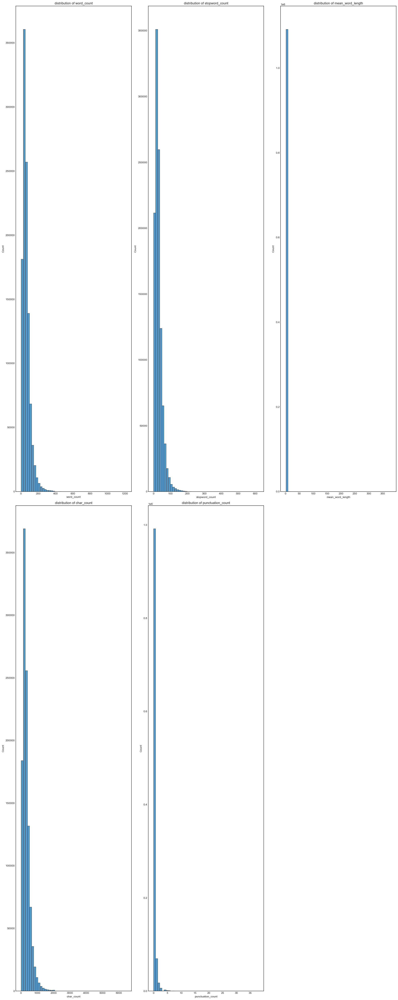

In [26]:
fig, axes = plt.subplots(2,3,figsize=(20, 50), dpi=100)
feature_names = ['word_count', 'stopword_count', 'mean_word_length', 'char_count', 'punctuation_count']

for i in range(2):
    if i == 0:
        for j in range(3):
            sns.histplot(meta_df[feature_names[j]], ax = axes[i, j], bins=50)
            axes[i, j].set_title(f'distribution of {feature_names[j]}')
    else:
        for j in range(2):
            sns.histplot(meta_df[feature_names[j+3]], ax = axes[i, j], bins=50)
            axes[i, j].set_title(f'distribution of {feature_names[j+3]}')      

axes[1, 2].set_visible(False)


plt.tight_layout()
plt.show()

## N-gram analysis

In [27]:
def generate_ngrams(text, n_gram=1):
    token = [token for token in text.lower().split(' ') if token != '' if token not in STOPWORDS]
    ngrams = zip(*[token[i:] for i in range(n_gram)])
    return [' '.join(ngram) for ngram in ngrams]

df_gram = review_df_all.copy()
df_gram = df_gram[['author_id','review_id','review_text']]

In [28]:
df_gram['unigram'] = review_df_all['review_text'].apply(lambda x: generate_ngrams(x, n_gram=1))
df_gram['bigram'] = review_df_all['review_text'].apply(lambda x: generate_ngrams(x, n_gram=2))
df_gram['trigram'] = review_df_all['review_text'].apply(lambda x: generate_ngrams(x, n_gram=3))

##### Unigram

Most common unigrams are mostly stop words and uncleand words (with punctuations), which do not contain much information, we need further cleaning.

Notice there are more positive words than negative words in the very top unigrams such as 'love' and 'great'.

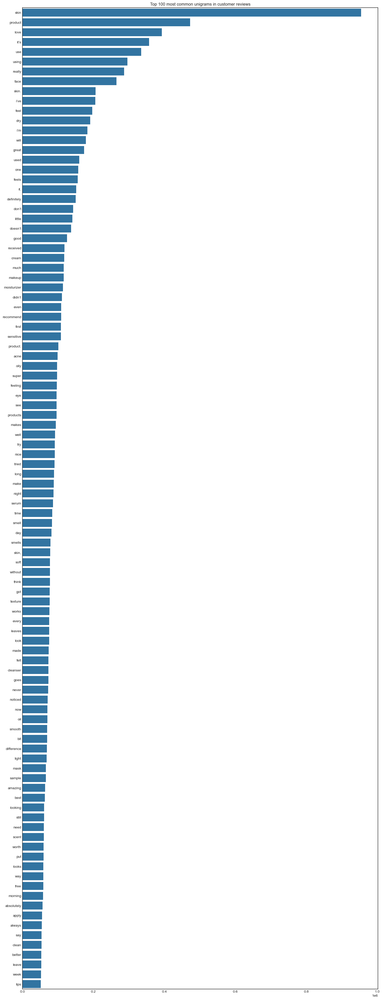

In [29]:
unigrams = defaultdict(int)

for row in df_gram['unigram']:
    for word in row:
        unigrams[word] += 1

df_unigram = pd.DataFrame(sorted(unigrams.items(), key=lambda x: x[1])[::-1])

fig, ax = plt.subplots(figsize=(18, 50), dpi=100)
N = 100
sns.barplot(y = df_unigram[0][:N], x=df_unigram[1][:N])

ax.set_xlabel('')
ax.set_ylabel('')
ax.set_title('Top 100 most common unigrams in customer reviews')
plt.show()

##### Bigram

Bigrams reveal more information, the most common bigrams are about skincare products, people who bought skincare category products are more likely to leave a comment. And more deatiled information of skin is shown, for instance, we see 'dry skin' and 'sensitive skin' are mentioned very frequently. 

But most bigrams are still stop words and uncleand words (with punctuations), we need further cleaning.

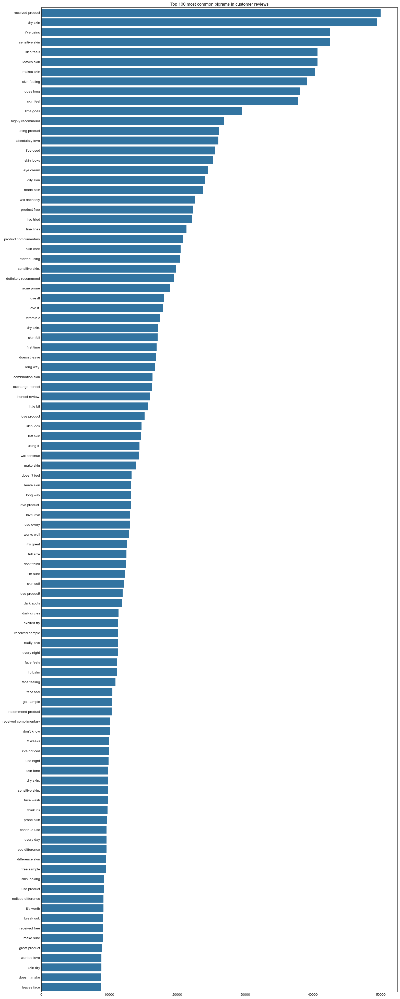

In [30]:
bigrams = defaultdict(int)

for row in df_gram['bigram']:
    for word in row:
        bigrams[word] += 1

df_bigram = pd.DataFrame(sorted(bigrams.items(), key=lambda x: x[1])[::-1])

fig, ax = plt.subplots(figsize=(18, 50), dpi=100)

sns.barplot(y = df_bigram[0][:N], x=df_bigram[1][:N])

ax.set_xlabel('')
ax.set_ylabel('')
ax.set_title('Top 100 most common bigrams in customer reviews')
plt.show()

##### Trigram

Most common trigrams are also about skin, from the most common trigram we see customers care long-lasting effects of the prodcuts.

The same most stop words and uncleand words issue also exists in the bigrams most common trigrams, we need further cleaning.

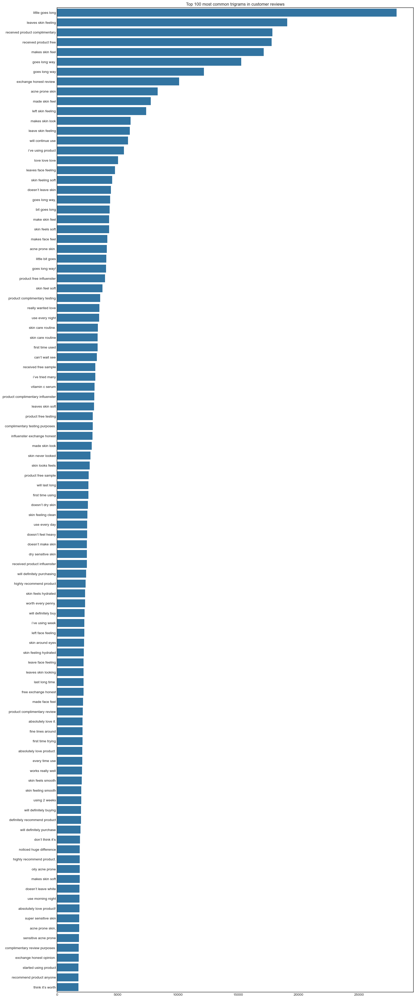

In [31]:
trigrams = defaultdict(int)

for row in df_gram['trigram']:
    for word in row:
        trigrams[word] += 1

df_trigram = pd.DataFrame(sorted(trigrams.items(), key=lambda x: x[1])[::-1])

fig, ax = plt.subplots(figsize=(18, 50), dpi=100)

sns.barplot(y = df_trigram[0][:N], x=df_trigram[1][:N])

ax.set_xlabel('')
ax.set_ylabel('')
ax.set_title('Top 100 most common trigrams in customer reviews')
plt.show()

## Product level

In [32]:
product_df.head()

,product_id,product_name,brand_id,brand_name,loves_count,rating,reviews,size,variation_type,variation_value,...,online_only,out_of_stock,sephora_exclusive,highlights,primary_category,secondary_category,tertiary_category,child_count,child_max_price,child_min_price
0,P473671,Fragrance Discovery Set,6342,19-69,6320,3.6364,11.0,NaN,NaN,NaN,...,1,0,0,"['Unisex/ Genderless Scent', 'Warm &Spicy Scen...",Fragrance,Value & Gift Sets,Perfume Gift Sets,0,NaN,NaN
1,P473668,La Habana Eau de Parfum,6342,19-69,3827,4.1538,13.0,3.4 oz/ 100 mL,Size + Concentration + Formulation,3.4 oz/ 100 mL,...,1,0,0,"['Unisex/ Genderless Scent', 'Layerable Scent'...",Fragrance,Women,Perfume,2,85.0,30.0
2,P473662,Rainbow Bar Eau de Parfum,6342,19-69,3253,4.2500,16.0,3.4 oz/ 100 mL,Size + Concentration + Formulation,3.4 oz/ 100 mL,...,1,0,0,"['Unisex/ Genderless Scent', 'Layerable Scent'...",Fragrance,Women,Perfume,2,75.0,30.0
3,P473660,Kasbah Eau de Parfum,6342,19-69,3018,4.4762,21.0,3.4 oz/ 100 mL,Size + Concentration + Formulation,3.4 oz/ 100 mL,...,1,0,0,"['Unisex/ Genderless Scent', 'Layerable Scent'...",Fragrance,Women,Perfume,2,75.0,30.0
4,P473658,Purple Haze Eau de Parfum,6342,19-69,2691,3.2308,13.0,3.4 oz/ 100 mL,Size + Concentration + Formulation,3.4 oz/ 100 mL,...,1,0,0,"['Unisex/ Genderless Scent', 'Layerable Scent'...",Fragrance,Women,Perfume,2,75.0,30.0


How many brands in this product dataset? How many products in this product dataset?

In [33]:
print('brand number: ', len(product_df['brand_name'].unique()))
print('product number: ', len(product_df['product_name'].unique()))

brand number:  304
product number:  8415


### loves_count

In [34]:
product_df['loves_count'].describe()

count    8.494000e+03
mean     2.917957e+04
std      6.609212e+04
min      0.000000e+00
25%      3.758000e+03
50%      9.880000e+03
75%      2.684125e+04
max      1.401068e+06
Name: loves_count, dtype: float64

loves_count NA number:  0


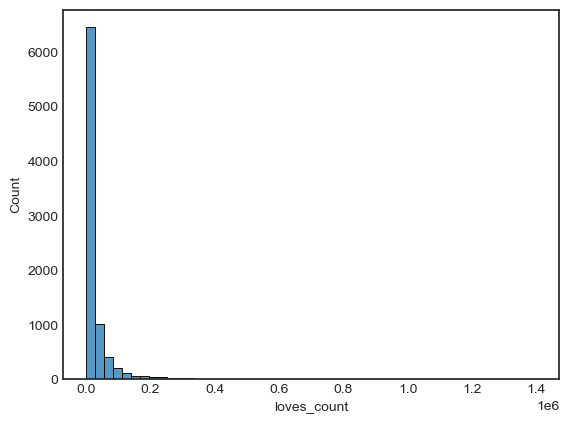

In [35]:
print('loves_count NA number: ', product_df['loves_count'].isna().sum())

sns.histplot(product_df['loves_count'],bins=50)
plt.show()

### rating

In [36]:
bins = [0, 1, 2, 3, 4, 5]
labels = ["(0,1]", "(1,2]", "(2,3]", "(3,4]", "(4,5]"]
product_df["rating_interval"] = pd.cut(product_df["rating"], bins=bins, right=True, labels=labels, include_lowest=False)

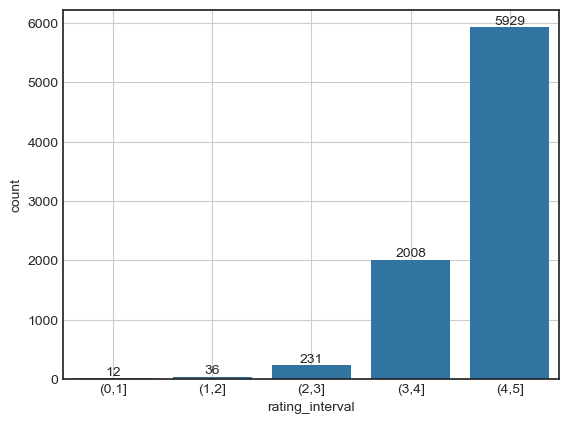

In [37]:
ax = sns.barplot(product_df["rating_interval"].value_counts().sort_index())
ax.bar_label(ax.containers[0], fontsize = 10)
plt.grid(True)
plt.show()

Remove the products that are NA valued in their sub-categories.

In [38]:
df_plot = product_df[~ product_df['tertiary_category'].isna()]

In [39]:
fig = px.sunburst(
    df_plot,
    path = ['primary_category', 'secondary_category', 'tertiary_category'],
    color = 'rating',
    maxdepth=-1,
    labels={'rating': 'Product Rating'}
)

fig.update_layout(
    width = 1200,
    height = 900,
    title={
        'text':"Proudct Category and Rating",
        'x': 0.47,
        'y': 0.95,
        'xanchor': 'center'
    },
    margin=dict(t=70)
)

fig.show()

### Category

In [40]:
print('primary category NA number: ', product_df['primary_category'].isna().sum())
print('secondary category NA number: ', product_df['secondary_category'].isna().sum())
print('tertiary category NA number: ', product_df['tertiary_category'].isna().sum())


primary category NA number:  0
secondary category NA number:  8
tertiary category NA number:  990


In [41]:
fig = px.sunburst(
    df_plot,
    path = ['primary_category', 'secondary_category', 'tertiary_category'],
    color = 'price_usd',
    maxdepth=-1,
    labels={'price_usd': 'Product Price'}
)

fig.update_layout(
    width = 1200,
    height = 900,
    title={
        'text':"Proudct Category and Price",
        'x': 0.47,
        'y': 0.95,
        'xanchor': 'center'
    },
    margin=dict(t=70)
)

fig.show()

In [42]:
df_plot['price_usd'].mean()

np.float64(53.52648454157782)

### Potential Relation Numerical Features

In [43]:
print('Product rating NA value number: ', product_df['rating'].isna().sum())
print('Product reviews NA value number: ', product_df['reviews'].isna().sum())
print('Product loves count NA value number: ', product_df['loves_count'].isna().sum())
print('Product price NA value number: ',product_df['price_usd'].isna().sum())

Product rating NA value number:  278
Product reviews NA value number:  278
Product loves count NA value number:  0
Product price NA value number:  0


Remove the products that are NA valued in the above mentioned features.

In [44]:
df_plot = product_df[~product_df['reviews'].isna()]

In [45]:
fig = px.parallel_coordinates(
    df_plot.iloc[:,[4, 5, 6, 12]], 
    color="price_usd", 
    color_continuous_scale=px.colors.diverging.Spectral, 
    labels={'price_usd': 'Product Price'},
)

fig.update_layout(
    title={
        'text': "Product Price against Product Numeric Features",
        'x': 0.5,
        'y': 0.99,
        'xanchor': 'center'
    },
    margin=dict(t=80)
)

fig.show()

Cheaper product, more customer leave reviews and have higer rating.

### Highlights

In [46]:
print('Proportion of products with no highlights: ', 
      np.round(product_df['highlights'].isna().sum() / product_df.shape[0],4))

Proportion of products with no highlights:  0.2598


In [47]:
product_df_1 = product_df.copy()
df_no_highlights = product_df_1[product_df_1['highlights'].isna()]
df_highlights = product_df_1[~ product_df_1['highlights'].isna()]

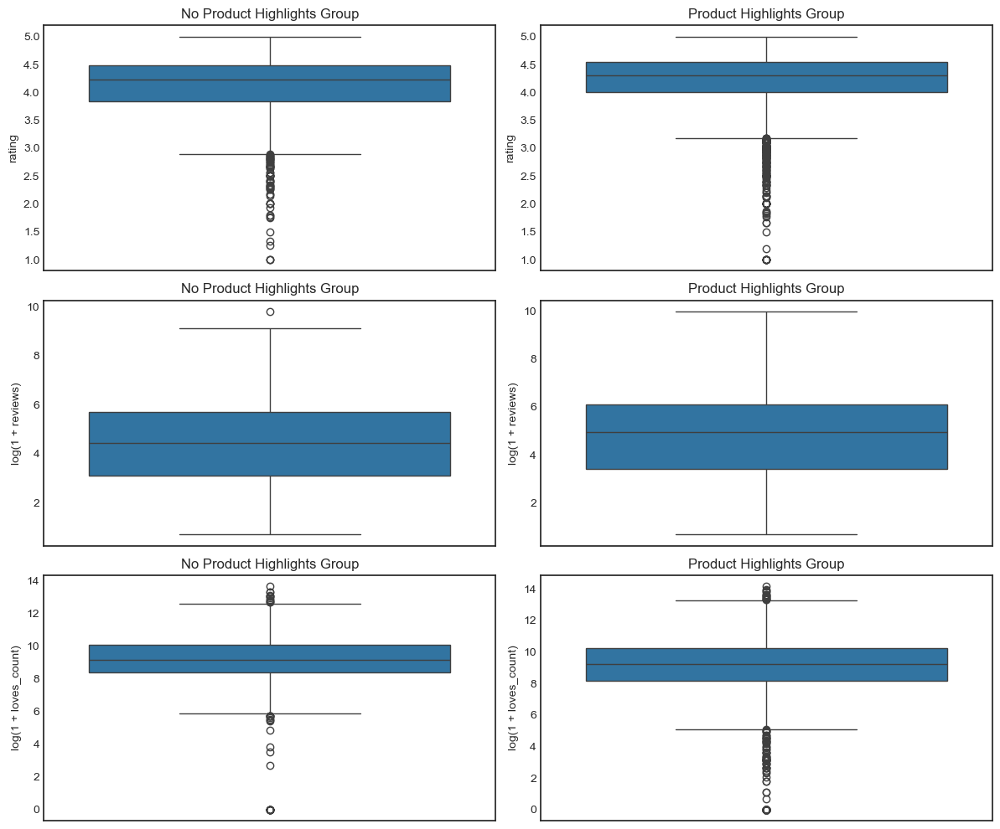

In [48]:
fig, axes = plt.subplots(3,2, figsize = (12, 10))
sns.boxplot(df_no_highlights['rating'], ax=axes[0,0])
axes[0,0].set_title('No Product Highlights Group')

sns.boxplot(df_highlights['rating'], ax=axes[0,1])
axes[0,1].set_title('Product Highlights Group')

sns.boxplot(np.log1p(df_no_highlights['reviews']), ax=axes[1,0])
axes[1,0].set_title('No Product Highlights Group')
axes[1,0].set_ylabel('log(1 + reviews)')

sns.boxplot(np.log1p(df_highlights['reviews']), ax=axes[1,1])
axes[1,1].set_title('Product Highlights Group')
axes[1,1].set_ylabel('log(1 + reviews)')

sns.boxplot(np.log1p(df_no_highlights['loves_count']), ax=axes[2,0])
axes[2,0].set_title('No Product Highlights Group')
axes[2,0].set_ylabel('log(1 + loves_count)')

sns.boxplot(np.log1p(df_highlights['loves_count']), ax=axes[2,1])
axes[2,1].set_title('Product Highlights Group')
axes[2,1].set_ylabel('log(1 + loves_count)')

plt.tight_layout()
plt.show()

In [49]:
pd.options.mode.chained_assignment = None

In [50]:
# warning triggered
df_highlights['highlights_list'] = df_highlights['highlights'].apply(ast.literal_eval)
df_highlights['highlights_list'] = df_highlights['highlights_list'].apply(lambda x: ' '.join(x))

df_highlights['highlights_list'] = df_highlights['highlights_list'].str.replace(r'(?<!\w)-(?!\w)', ' ', regex=True)
df_highlights['highlights_list'] = df_highlights['highlights_list'].str.replace(r'[^\w\s-]', ' ', regex=True)
df_highlights['highlights_list'] = df_highlights['highlights_list'].str.strip()
df_highlights['highlights_list'] = df_highlights['highlights_list'].str.split()
df_highlights['highlights_list'] = df_highlights['highlights_list'].apply(lambda x: ' '.join(x))

In [51]:
df_highlights['unigram'] = df_highlights['highlights_list'].apply(lambda x: generate_ngrams(x, n_gram=1))

unigrams = defaultdict(int)

for row in df_highlights['unigram']:
    for word in row:
        unigrams[word] += 1

df_unigram = pd.DataFrame(sorted(unigrams.items(), key=lambda x: x[1])[::-1])

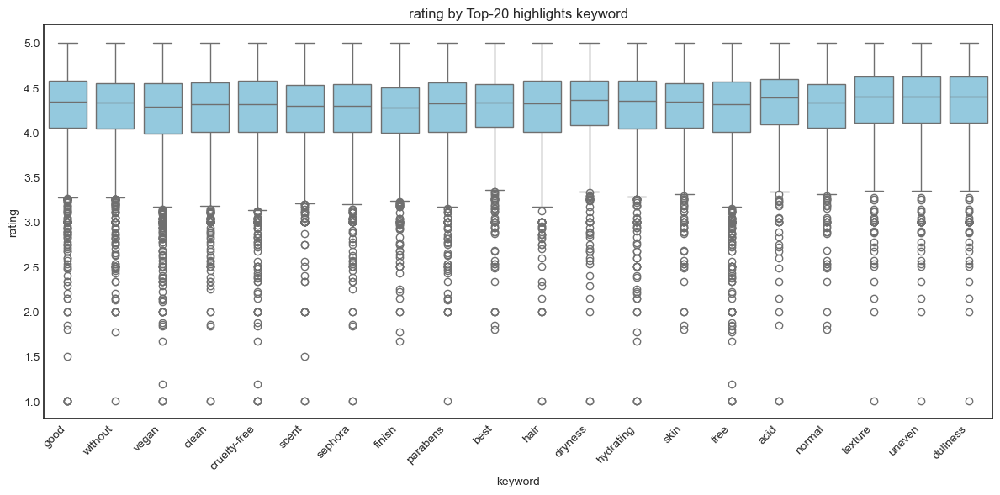

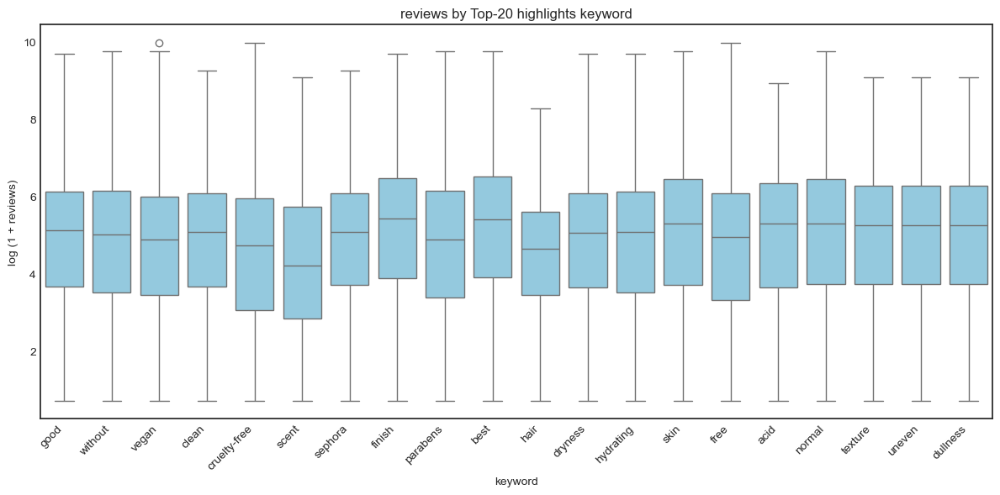

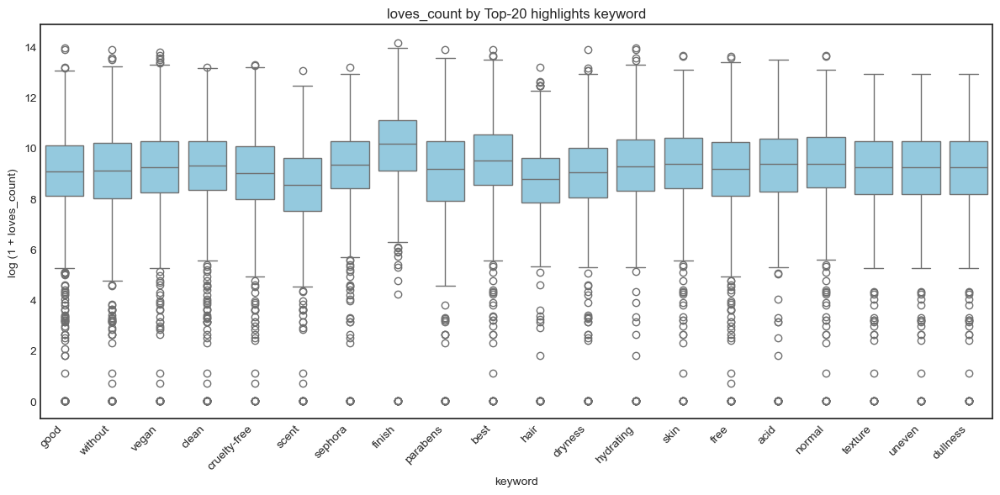

In [52]:
rows = list(df_unigram.loc[df_unigram.iloc[:, 1] >= 900, 0]) # Top 20
col_names = ["rating", "reviews", "loves_count"]

for col in col_names:
    plot_data = []
    for word in rows:
        sub = df_highlights[df_highlights["highlights_list"]
                            .str.contains(word, case=False, regex=False)][col]
        vals = np.log1p(sub) if col != "rating" else sub
        plot_data.append(pd.DataFrame({
            "word": word,
            col: vals
        }))
    plot_df = pd.concat(plot_data, ignore_index=True)

    plt.figure(figsize=(12, 6))
    sns.boxplot(data=plot_df, x="word", y=col, color="skyblue")
    plt.xticks(rotation=45, ha="right")
    plt.xlabel("keyword")
    plt.ylabel(col if col == "rating" else f"log (1 + {col})")
    plt.title(f"{col} by Top-20 highlights keyword")
    plt.tight_layout()
    plt.show()


## Review Level

How many customers posted at least 1 review?

In [53]:
print('Unique customers: ', len(review_df_all_deduplicate['author_id'].unique()))

Unique customers:  96666


### Time spam

In [54]:
review_df_all_deduplicate['submission_year'] = pd.to_datetime(review_df_all_deduplicate['submission_time']).dt.year
review_df_all_deduplicate['submission_month'] = pd.to_datetime(review_df_all_deduplicate['submission_time']).dt.month

In [55]:
plot_data = review_df_all_deduplicate.loc[:, ['submission_year', 'submission_month']]
plot_data = plot_data.groupby(["submission_year", "submission_month"]).size().reset_index(name="count")
plot_data

,submission_year,submission_month,count
0,2008,8,4
1,2008,9,216
2,2008,10,58
3,2008,11,90
4,2008,12,67
...,...,...,...
171,2022,11,1819
172,2022,12,2608
173,2023,1,3313
174,2023,2,2879


In [56]:
fig = px.sunburst(
    plot_data,
    path=["submission_year", "submission_month"],
    values="count",
    color="count",
    color_continuous_scale="YlOrRd",
    labels={"count": "Reviews Count by Month"},
)

fig.update_layout(
    width = 800,
    height = 900,
    title={
        'text':"Reviews Count",
        'x': 0.47,
        'y': 0.95,
        'xanchor': 'center'
    },
    margin=dict(t=70)
)

fig.show()

Note: 可ignore年份的颜色，关注饼图proportion即可

### Potential relation rating?

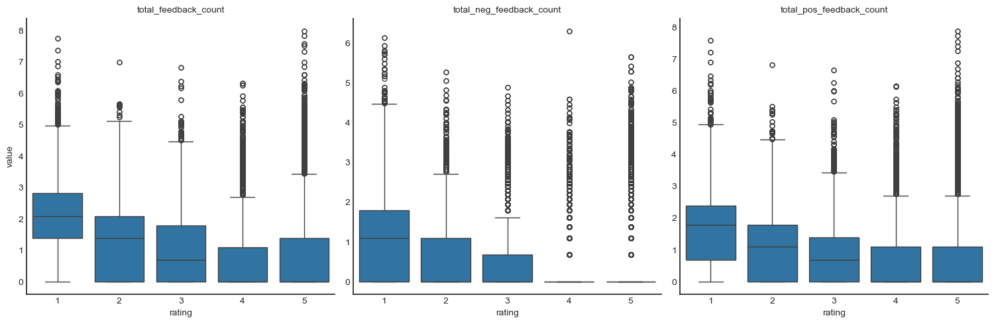

In [57]:
features = ["total_feedback_count", "total_neg_feedback_count", "total_pos_feedback_count"]

long = review_df_all_deduplicate.melt(id_vars="rating",
                   value_vars=features,
                   var_name="feature",
                   value_name="value")
long["value"] = np.log1p(long["value"])  # 取 log1p

g = sns.catplot(
    data=long,
    x="rating", y="value",
    col="feature", col_wrap=3,
    kind="box",
    sharey=False  # 若想各特征共用同一 y 轴改为 True
)
g.set_titles("{col_name}")
g.set_axis_labels("rating", "value")
plt.tight_layout()
plt.show()

Meta feature?

In [58]:
review_df_all_deduplicate_1 = review_df_all_deduplicate.copy()
merged = review_df_all_deduplicate_1.merge(meta_df, on = 'review_text', how = 'inner')

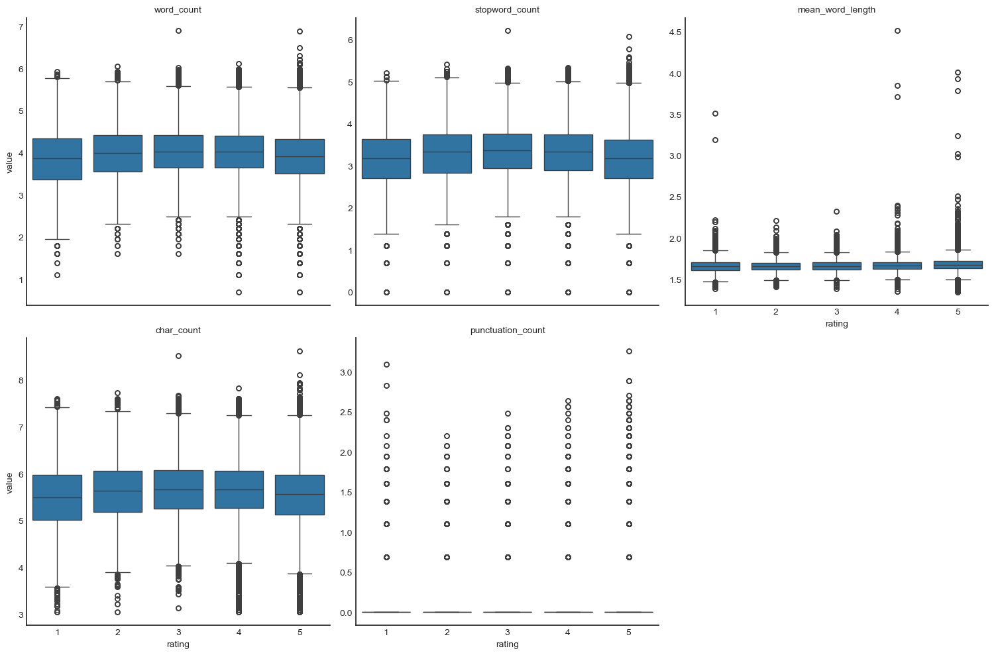

In [59]:
features = ["word_count", "stopword_count", "mean_word_length", "char_count", "punctuation_count"]

long = merged.melt(id_vars="rating",
                   value_vars=features,
                   var_name="feature",
                   value_name="value")
long["value"] = np.log1p(long["value"])  # 取 log1p

g = sns.catplot(
    data=long,
    x="rating", y="value",
    col="feature", col_wrap=3,
    kind="box",
    sharey=False  # 若想各特征共用同一 y 轴改为 True
)
g.set_titles("{col_name}")
g.set_axis_labels("rating", "value")
plt.tight_layout()
plt.show()

### Top reviews barnd

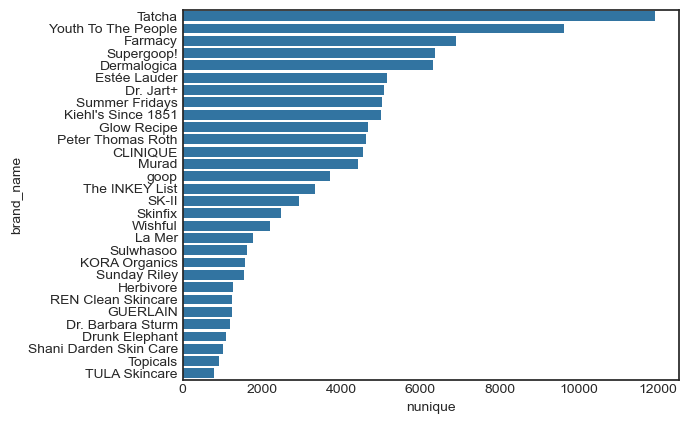

In [60]:
plot_data = review_df_all_deduplicate.groupby('brand_name')['author_id'].agg(['nunique']).sort_values(by = 'nunique', ascending=False)[:30]
plot_data = pd.DataFrame(plot_data)
sns.barplot(y='brand_name', x ='nunique', data=plot_data)
plt.show()

In [61]:
process_df = review_df_all_deduplicate[review_df_all_deduplicate['brand_name'].isin(np.array(plot_data.index))]

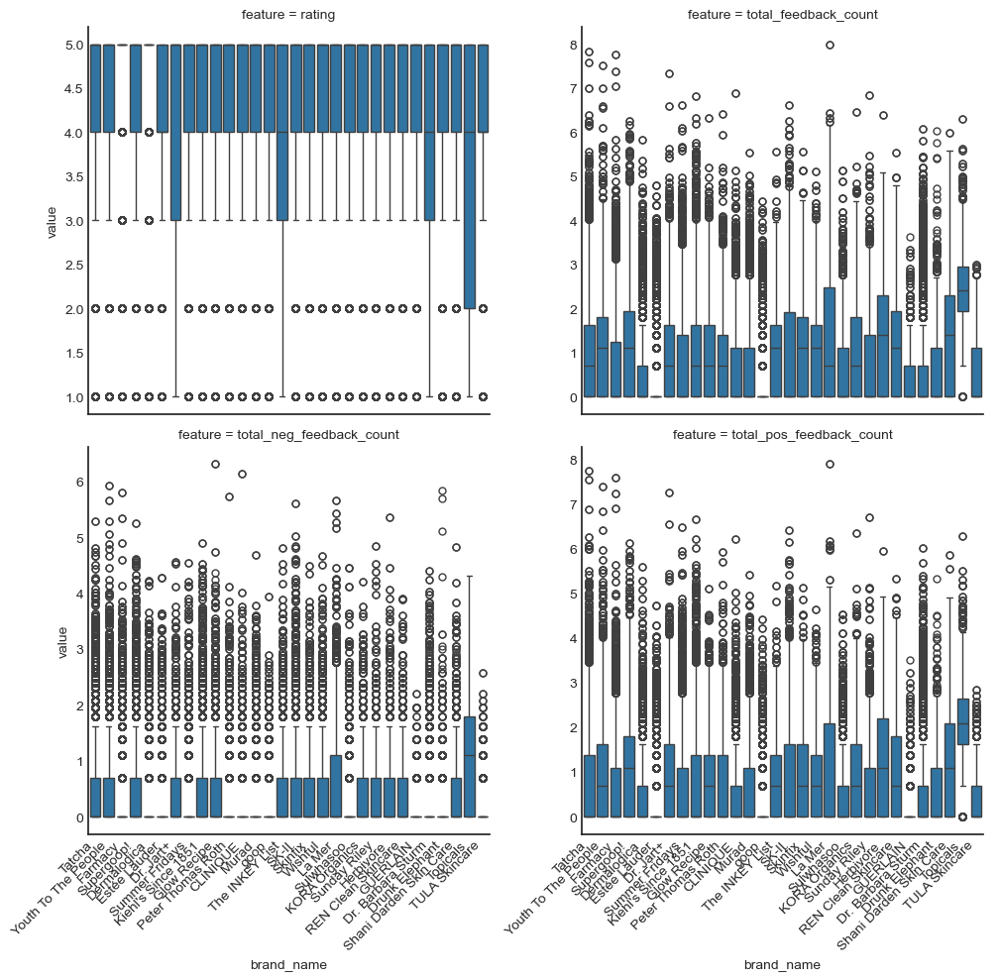

In [62]:
order = np.array(plot_data.index)

count_cols = ["total_feedback_count", "total_neg_feedback_count", "total_pos_feedback_count"]
features = ["rating"] + count_cols

tmp = process_df.copy()
tmp[count_cols] = tmp[count_cols].apply(np.log1p)
tmp["brand_name"] = pd.Categorical(tmp["brand_name"], categories=order, ordered=True)

long = tmp.melt(id_vars="brand_name", value_vars=features,
                var_name="feature", value_name="value")

g = sns.catplot(data=long, x="brand_name", y="value",
                col="feature", col_wrap=2, kind="box", sharey=False)

for ax in g.axes.flatten():
    ax.tick_params(axis="x", labelrotation=45)
    for lbl in ax.get_xticklabels():
        lbl.set_horizontalalignment("right")
plt.tight_layout(); plt.show()


C:\Users\fuyuz\AppData\Local\Temp\ipykernel_23556\3451935930.py:7: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




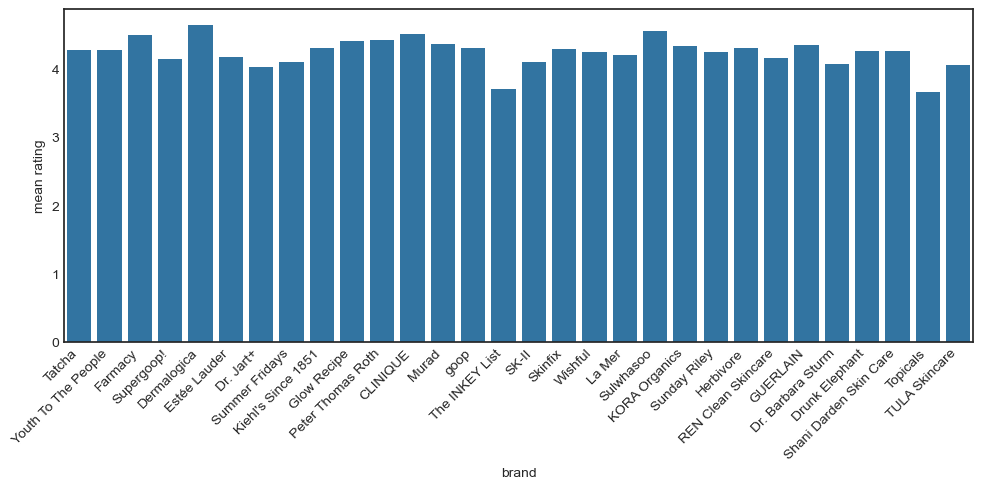

In [63]:
order = np.array(plot_data.index)

tmp = process_df.copy()
tmp["brand_name"] = pd.Categorical(tmp["brand_name"], categories=order, ordered=True)

plt.figure(figsize=(10, 5))
sns.barplot(data=tmp, x="brand_name", y="rating", estimator=np.mean, ci=None, order=order)
plt.xticks(rotation=45, ha="right")
plt.ylabel("mean rating")
plt.xlabel("brand")
plt.tight_layout()
plt.show()

# Word Embedding (Before cleaning)

Load FastText-Crawl-300d-2M.

In [64]:
embedding = fasttext.load_model('D:/MachineLearning/fasttext/crawl-300d-2M-subword.bin')

In [65]:
def build_vocab(X):
    reviews = X.apply(lambda s: s.lower().split()).values      
    vocab = {}
    
    for review in reviews:
        for word in review:
            try:
                vocab[word] += 1
            except KeyError:
                vocab[word] = 1                
    return vocab


def check_embeddings_coverage(X, embeddings):
    
    vocab = build_vocab(X)    
    
    covered = {}
    oov = {}    
    n_covered = 0
    n_oov = 0
    
    for word in vocab:
        try:
            covered[word] = embeddings[word]
            n_covered += vocab[word]
        except:
            oov[word] = vocab[word]
            n_oov += vocab[word]
            
    vocab_coverage = len(covered) / len(vocab)
    text_coverage = (n_covered / (n_covered + n_oov))
    
    sorted_oov = sorted(oov.items(), key=operator.itemgetter(1))[::-1]
    return sorted_oov, vocab_coverage, text_coverage

In [66]:
fasttext_oov, fasttext_vocab_coverage, fasttext_text_coverage = check_embeddings_coverage(review_df_all_deduplicate['review_text'], embedding)

print('FastText Embeddings cover {:.2%} of vocabulary and {:.2%} of text in review_df_all_deduplicate dataset'.format(fasttext_vocab_coverage, fasttext_text_coverage))

FastText Embeddings cover 100.00% of vocabulary and 100.00% of text in review_df_all_deduplicate dataset


Both vocabulary and text coverage look good, so we are only doing extra mild text cleaning. 

# Text Cleaning

In [67]:
review_df_all_deduplicate['review_text'] = review_df_all_deduplicate['review_text'].str.lower()

We only use English reviews, all non-English reviews will be removed.

In [68]:
review_df_all_deduplicate.to_csv("./dataset/review_df_all_deduplicate_all_language.csv", index = True, encoding = 'utf-8')

In [69]:
review_df_all_deduplicate = pd.read_csv("./dataset/review_df_all_deduplicate_english.csv", index_col = 0)

## Standardize unicode

In [70]:
def clean_unicode(text):
    text = unicodedata.normalize('NFKC', text)

    replace_map = {
        "’": "'", "‘": "'", "´": "'", "`": "'",      # 单引号家族 → '
        "“": '"', "”": '"',                          # 双引号家族 → "
        "–": "-", "—": "-", "-": "-", "−": "-",      # 各种 dash → -

        "。": ".", "、": ",", "・": " ", 
    }

    for old, new in replace_map.items():
        text.replace(old, new)

    return text

In [71]:
review_df_all_deduplicate['review_text_cleaned'] = review_df_all_deduplicate['review_text'].map(clean_unicode)

## Non-ASCII

In [72]:
allowed = string.ascii_letters + string.digits + string.whitespace + string.punctuation
pattern = f"[^{re.escape(allowed)}]"   # 任何不在 allowed 里的字符

mask = review_df_all_deduplicate['review_text'].str.contains(pattern, na=False)

non_standard_char = set("".join(review_df_all_deduplicate.loc[mask, 'review_text']).translate({ord(c): None for c in allowed}))
print('Non-standard characters in product reviews: ', '\n', non_standard_char)

review_df_all_deduplicate_bad_char = review_df_all_deduplicate.loc[mask, 'review_text']

Non-standard characters in product reviews:  
 {'😉', 'å', '🤯', '˙', 'ç', 'é', '🙂', '！', 'ē', '\u2028', '😏', '\x7f', '＜', '🤦', 'à', '😊', '🏻', 'ʟ', '😞', '🥶', '☺', '🙏', 'ツ', 'ᵕ', '🥰', '“', '😃', '🐐', '™', '·', 'ᴇ', '⃣', '💙', '‘', '☝', '🤓', 'ó', '\uf0a7', '💯', '😫', '☆', '”', 'ñ', 'ú', '̇', 'ü', '🔥', '👌', '‑', '½', '🫶', 'ᴀ', 'è', 'ヽ', '‐', '…', '\u2060', '🏾', '🥺', '👏', '😔', '❣', '◼', '💗', '⚡', 'ﾉ', '🙌', '«', '🌺', 'ᴘ', '⅛', '．', '😂', '❌', '⋯', '́', '🧼', 'ô', '🪄', '✨', 'â', '°', '‼', '🏽', '😅', 'ᴅ', '😬', '。', '＞', 'ɴ', '🙁', '️', '⭐', '😭', '✅', 'ä', '🙃', '„', '🥹', '◡', '̈', '♡', 'ʀ', '’', 'í', '💕', 'ᴛ', '☀', '✔', 'ɪ', '😍', '、', '🍅', '🍯', 'ʻ', 'á', '♥', '®', '👍', '\u200b', '😢', '∙', '—', '\u200d', '❤', '・', '»', '\u2009', '﹏', '🤷', '♀', '，', '\u2063', '👎', '💜', '😆', 'ᴍ', '🤩', 'ʏ', '🍞', '♻', '😁', '😖', '🤍', '☹', 'ω', '🏼', '－', '💚', '⠀', 'ö', 'î', 'ß', '￼', '¯', '´', 'ᴜ', '–', '💔', '•', '£'}


Non-English characters(punctuations and letters), keep emoji.

In [73]:
non_english_chars = [
    # Chinese
    '什','部','本','我','这','时','惊','连','摩','粉','省','果','癌','平','妆','完','最','来','全','星','快','干','么','过','救','方','卸','是','题','要','相','脸','啊','温','并','用','还','懒','棉','净','需','非','掉','长','闭','乳','很','都','底','化','艳','好','避','品','对','的','产','没','问',

    # Arabic
    'ا','ب','ت','ج','ح','د','ر','س','ش','ط','ع','ق','ك','ل','م','ن','ه','و','ي','ة','ى','ئ',

    # Latin extended + Vietnamese
    'à','á','â','ã','ä','å','ç','è','é','ê','ë','ì','í','î','ï','ò','ó','ô','ö','ù','ú','û','ü',
    'ñ','ß','ă','ạ','ả','ấ','ầ','ẩ','ậ','ắ','ặ','ằ','ẳ','ẵ','ẹ','ế','ề','ễ','ệ','ị','ố','ồ','ổ','ộ',
    'ớ','ờ','ở','ỡ','ợ','ủ','ữ','ự','ý',

    # Special punctuation / symbols
    '·','＞','«','»','◡','◼','・','‐','—','－','–','‹','›','∙','•','☆','★','°','½','⅛','‼','™','®','£','¯','…','⋯','，','。','．','、','！',

    # Invisible characters (use escapes)
    "\uf0a7","\u2060","\u2063","\u200b","\u2028","\u2009","\x7f","\u2800","\u200d",

    # Emoji
    '💙','😖','🥹','🙌','💗','🤦','💕','😞','😉','🏾','😢','😃','☹','😬','🙁','🤦‍♀️','🤓','⭐','😆','🙂',
    '🥶','😫','😍','😔','😊','😂','🤯','🤷','🧼','🫶','💚','😭','🌺','🐐','❣','❌','✔','🤍','💔','💯',
    '👌','👏','👍','🔥','✨','🏽','🏼','️','♻','☀',

    # Small caps / decorative letters / kaomoji
    'ᵕ','ᴘ','ʀ','ᴜ','ᴅ','ᴍ','ᴇ','ʟ','ʏ','ɪ','ɴ','ω','ツ','ノ','ヽ'
]


In [74]:
# English letters + number + ASCII punctuation
ascii_allowed = r"[A-Za-z0-9\s\.,!?;:'\"()\-\[\]{}]"

emoji_pattern = (
    r"[\U0001F1E0-\U0001F1FF"  # Flags
    r"\U0001F300-\U0001F5FF"   # Symbols & pictographs
    r"\U0001F600-\U0001F64F"   # Emoticons
    r"\U0001F680-\U0001F6FF"   # Transport & map symbols
    r"\U0001F700-\U0001F77F"   # Alchemical symbols
    r"\U0001F780-\U0001F7FF"   # Geometric symbols
    r"\U0001F800-\U0001F8FF"   # Supplemental arrows
    r"\U0001F900-\U0001F9FF"   # Supplemental symbols & pictographs
    r"\U0001FA00-\U0001FA6F"   # Chess, symbols
    r"\U0001FA70-\U0001FAFF"   # Emoji components
    r"\U00002702-\U000027B0"   # Dingbats
    r"\U000024C2-\U0001F251"   # Enclosed characters
    r"]"
)

allowed = f"(?:{ascii_allowed}|{emoji_pattern})"

def clean_text_keep_emoji(text):
    return "".join(char if re.match(allowed, char) else "" for char in text)

review_df_all_deduplicate['review_text_cleaned'] = review_df_all_deduplicate['review_text_cleaned'].apply(lambda x: clean_text_keep_emoji(x))

In [75]:
punc_lis_remain = []

for text in review_df_all_deduplicate['review_text_cleaned']:
    punc_lis_remain.extend(re.findall(r"[^\w\s]", text))

punc_lis_remain = sorted(set(punc_lis_remain), key=lambda ch: ord(ch)) # 避免下次元素位置重置
punc_lis_remain = [p for p in punc_lis_remain if not p.isascii()]

punc_lis_remain = np.array(punc_lis_remain)[[0,1, 2,3, 5, 6, 7, 8, 9, 10, 13, 16, 17, 18, 20, 21, 22, 23, 24, 25, 30, 31, 32, 33]]

pat = "[" + re.escape("".join(punc_lis_remain)) + "]"
review_df_all_deduplicate["review_text_cleaned"] = review_df_all_deduplicate["review_text_cleaned"].str.replace(pat, "", regex=True)

## Abbreviation

Contraction, e.g. i've, don't, etc.

In [76]:
df_gram_abbreviation = review_df_all_deduplicate.copy()
df_gram_abbreviation = pd.DataFrame(df_gram_abbreviation['review_text_cleaned'])
df_gram_abbreviation['unigram'] = df_gram_abbreviation['review_text_cleaned'].apply(lambda x: generate_ngrams(x, n_gram=1))

all_tokens = (tok for lst in df_gram_abbreviation["unigram"] for tok in lst)

pattern = re.compile(r"[']")
abbr_tokens = [t for t in all_tokens if pattern.search(t)]

print('Number of tokens that contain \': ', len(abbr_tokens))

Number of tokens that contain ':  0


Abbreviation

In [77]:
all_tokens = (tok for lst in df_gram_abbreviation["unigram"] for tok in lst)
short_tokens = [t for t in all_tokens if len(t) < 4]
short_freq = Counter(short_tokens)

short_freq.most_common(300) # top 300


[('use', 75711),
 ('ive', 46001),
 ('im', 42936),
 ('dry', 42025),
 ('it.', 35990),
 ('one', 33303),
 ('try', 21790),
 ('see', 20136),
 ('got', 17914),
 ('day', 16768),
 ('oil', 16691),
 ('bit', 16180),
 ('now', 15240),
 ('way', 14232),
 ('say', 12401),
 ('me.', 11905),
 ('lot', 11704),
 ('put', 11564),
 ('it!', 11331),
 ('-', 11190),
 ('buy', 10941),
 ('go', 10743),
 ('new', 10566),
 ('it,', 9881),
 ('two', 7908),
 ('eye', 7736),
 ('2', 7628),
 ('far', 6437),
 ('3', 6402),
 ('ill', 6132),
 ('job', 6073),
 ('bad', 5985),
 ('id', 5367),
 ('red', 5197),
 ('.', 4840),
 ('big', 4740),
 ('top', 4654),
 ('may', 4576),
 ('gel', 4504),
 ('saw', 4478),
 ('spf', 4344),
 ('yet', 4158),
 ('5', 4153),
 ('fan', 4017),
 ('add', 3913),
 ('up.', 3802),
 ('4', 3691),
 ('let', 3610),
 ('end', 3559),
 ('jar', 3540),
 ('rub', 3313),
 ('due', 3300),
 ('me,', 3281),
 ('!', 2964),
 (',', 2944),
 ('sun', 2903),
 ('rid', 2872),
 ('on.', 2811),
 ('(i', 2806),
 ('la', 2538),
 ('run', 2443),
 ('c', 2347),
 ('old',

Contraction mapping:

ive - i have 

im - i am 

ill - i will

spf - sun protection factor

bc - because

dr. - doctor

def - definitely

ptr - peter thomas roth

bha - beta hydroxy acid

omg - oh my god

lol - laugh out loud

aha - alpha hydroxy acid

bb (bb cream) - beauty balm

soo - so

ha - hyaluronic acid

30s - 30 seconds

2nd - second

3rd - third

(im - i am

dr - doctor

1st - first

idk - i do not know

ur - your

tho - though

fav - favorite

ceo - sunday riley c.e.o (we don't include c.e.o)

hg - holy grail

etc - et cetera

20s - 20 seconds

vib - very important beauty insider

min - minutes

ph - potential of hydrogen

3x - 3 times

lil - little

4th - fourth

itd - it would

cuz - because

vit - vitamin

40s - 40 seconds

pha - polyhydroxy acid

meh - eh (treat as stopwords)

fab - first aid beauty

uv - ultraviolet

---

ii - i (keep sk-ii)

In [78]:
correct_map = {
    r"\bive\b": "i have",
    r"\bim\b": "i am",
    r"\bill\b": "i will",
    r"\bspf\b": "sun protection factor",
    r"\bbc\b": "because",
    r"\bdr\.\b": "doctor",
    r"\bdr\b": "doctor",
    r"\bdef\b": "definitely",
    r"\bptr\b": "peter thomas roth",
    r"\bbha\b": "beta hydroxy acid",
    r"\baha\b": "alpha hydroxy acid",
    r"\bbb\b": "beauty balm",
    r"\bha\b": "hyaluronic acid",
    #r"\bsoo+\b": "so",          # 可用 + 兼容 soo/sooo…
    r"\bomg\b": "oh my god",
    r"\blol\b": "laugh out loud",
    r"\bidk\b": "i do not know",
    r"\bur\b": "your",
    r"\btho\b": "though",
    r"\bfav\b": "favorite",
    r"\bceo\b": "sunday riley",
    r"\bhg\b": "holy grail",
    r"\betc\b": "et cetera",
    r"\bvib\b": "very important beauty insider",
    r"\bmin\b": "minutes",
    r"\bph\b": "potential of hydrogen",
    r"\bmeh\b": "eh",
    r"\bfab\b": "first aid beauty",
    r"\buv\b": "ultraviolet",
    r"\bitd\b": "it would",
    r"\bcuz\b": "because",
    r"\bvit\b": "vitamin",
    r"\b30s\b": "30 seconds",
    r"\b20s\b": "20 seconds",
    r"\b40s\b": "40 seconds",
    r"\b1st\b": "first",
    r"\b2nd\b": "second",
    r"\b3rd\b": "third",
    r"\b4th\b": "fourth",
    r"\b3x\b": "3 times",
    r"\blil\b": "little",

    # 后补上的
    r"\bwouldnt\b": "would not",
    r"\bhavec\b": "have",
    r"\bbomb.com\b": "great",
    r"\byrs\b": "years",
    r"\bfyi\b": "for your information",
    r"\brn\b": "right now"
}

review_df_all_deduplicate['review_text_cleaned'] = (
    review_df_all_deduplicate['review_text_cleaned']
    .replace(correct_map,regex=True)
)

ii

In [79]:
COMMON_VERBS_AFTER_I = {
    "love","like","think","use","used","feel","felt","have","had","am",
    "would","will","wish","want","tried","try","bought","buy",
    "recommend","ordered","order","see","saw","noticed","notice",
    "find","found","hate","dislike","prefer","need","needed",

    # 后加的
    "mean", "only", "also", "heard", 
}

def fix_ii_typos(text):

    tokens = text.split()
    new_tokens = []

    for idx, tok in enumerate(tokens):
        lower_tok = tok.lower()

        if lower_tok == "ii":
            prev_tok = tokens[idx-1].lower() if idx > 0 else ""
            next_tok = tokens[idx+1].lower() if idx+1 < len(tokens) else ""

            # 1) 如果前一个是数字，比如 "6 ii" -> 认为是罗马数字，不改
            if prev_tok.isdigit():
                new_tokens.append(tok)
            # 2) 如果后一个是常见动词，很像 "i + verb" 的结构 -> 认为是 typo
            elif next_tok in COMMON_VERBS_AFTER_I:
                # 保留原大小写风格，这里简单统一成小写 i
                new_tokens.append("i")
            else:
                # 不确定就保留，以免误伤
                new_tokens.append(tok)
        else:
            new_tokens.append(tok)

    return " ".join(new_tokens)

mask = review_df_all_deduplicate['review_text_cleaned'].str.contains(r'\bii\b', regex=True)
review_df_all_deduplicate.loc[mask, 'review_text_cleaned'] = review_df_all_deduplicate.loc[mask, 'review_text_cleaned'].apply(fix_ii_typos)

## URL

In [80]:
def clean_URL(text):
    url = re.compile(r'https?://\S+|www\.\S+|\bhttps?\b') # enhanced, remove residual 'http'
    
    return url.sub('',text).strip()

review_df_all_deduplicate['review_text_cleaned'] = review_df_all_deduplicate['review_text_cleaned'].map(clean_URL)
review_df_all_deduplicate['review_text_cleaned'] = review_df_all_deduplicate['review_text_cleaned'].str.replace(r"\b[\w.-]+\.com\b", "", regex=True)

## Letter Repeat

In [81]:
mask = review_df_all_deduplicate['review_text_cleaned'].str.contains(r"([A-Za-z])\1{2,}", regex=True)


review_df_all_deduplicate.loc[mask, 'review_text_cleaned'] = (
    review_df_all_deduplicate.loc[mask, 'review_text_cleaned']
    .str.replace(r"([A-Za-z])\1{2,}", r"\1\1", regex=True)
)

C:\Users\fuyuz\AppData\Local\Temp\ipykernel_23556\277250214.py:1: UserWarning:

This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.



In [82]:
df_gram_repeat = review_df_all_deduplicate.loc[mask, 'review_text_cleaned'].copy()
df_gram_repeat = pd.DataFrame(df_gram_repeat)
df_gram_repeat['unigram'] = df_gram_repeat['review_text_cleaned'].apply(lambda x: generate_ngrams(x, n_gram=1))

In [83]:
all_tokens = (tok for lst in df_gram_repeat["unigram"] for tok in lst)

short_tokens = [t for t in all_tokens if re.search(r"([A-Za-z])\1", t)] 
short_freq = Counter(short_tokens)

short_freq.most_common(500) # top 500

[('soo', 2280),
 ('really', 1454),
 ('will', 1299),
 ('feel', 1103),
 ('feels', 997),
 ('little', 980),
 ('good', 797),
 ('smells', 552),
 ('feeling', 514),
 ('recommend', 508),
 ('look', 493),
 ('see', 445),
 ('well', 437),
 ('smell', 426),
 ('still', 423),
 ('need', 416),
 ('smooth', 411),
 ('full', 394),
 ('looking', 367),
 ('stuff', 360),
 ('looks', 355),
 ('actually', 333),
 ('week', 325),
 ('better', 319),
 ('lovee', 296),
 ('bottle', 294),
 ('difference', 272),
 ('literally', 264),
 ('pretty', 259),
 ('loove', 257),
 ('apply', 253),
 ('redness', 253),
 ('weeks', 238),
 ('happy', 235),
 ('free', 234),
 ('sunscreen', 232),
 ('looked', 229),
 ('less', 220),
 ('getting', 218),
 ('usually', 217),
 ('small', 209),
 ('keep', 206),
 ('well.', 185),
 ('all.', 170),
 ('different', 163),
 ('especially', 159),
 ('good.', 154),
 ('off.', 152),
 ('took', 152),
 ('tell', 149),
 ('finally', 141),
 ('loong', 135),
 ('overall', 119),
 ('totally', 112),
 ('smooth.', 111),
 ('essence', 110),
 ('way

In [84]:
review_df_all_deduplicate.loc[review_df_all_deduplicate['review_text_cleaned'].str.contains(r"\biffy\b"), 'review_text_cleaned']

56175     this product is great! i was iffy in using poi...
58542     at first i was super iffy it just seemed so od...
59144     i have always been iffy about cleansing balms ...
62344     this product is great! i was iffy in using poi...
64711     at first i was super iffy it just seemed so od...
                                ...                        
913781    finally found my holy grail sunscreen! in the ...
936270    i received this product as a gift in exchange ...
937323    i received this product as a gift in exchange ...
940365    i want to give this product a better review. t...
941395    i want to give this product a better review. t...
Name: review_text_cleaned, Length: 105, dtype: object

In [85]:
correct_map_1 = {
    r"\bsoo\b": "so",
    r"\bsooo\b": "so",
    r"\bsoooo\b": "so",
    r"\bsooooo\b": "so",

    r"\blovee\b": "love",
    r"\bloove\b": "love",
    r"\bloong\b": "long",
    r"\bwayy\b": "way",
    r"\bgonna\b": "going to",
    r"\bwaay\b": "way",
    r"\bsuuper\b": "super",
    r"\byttp\b": "youth to the people",
    r"\byoull\b": "you will",
    r"\blongg\b": "long",
    r"\bnighttime\b": "night time",    
    r"\bitll\b": "it will",
    r"\breallyy\b": "really", 
    r"\bwanna\b": "want to", 
    r"\bohh\b": "oh", 
    r"\bbuut\b": "but", 
    r"\byall\b": "you all",
    r"\bloovvee\b": "love",    
    r"\blovee\.\b": "love",      
    r"\bamazingg\b": "amazing",       
    r"\bwoww\b": "wow",     
    r"\bsuperr\b": "super",
    r"\baand\b": "and",
    r"\bamazingg\.\b": "amazing", 
    r"\bnoo\b": "no", 
    r"\bgotta\b": "got to", 
    r"\bdeff\b": "definitely", 
    r"\bveryy\b": "very", 
    r"\bandd\b": "and",
    r"\bomgg\b": "oh my god",
    r"\bloove\.\b": "love",
    r"\bloovee\b": "love",
    r"\blooved\b": "loved",
    r"\byess\b": "yes",
    r"\byall,\b": "you all",
    r"\bhuuge\b": "huge",
    r"\byess!\b": "yes",
    r"\blovvee\b": "love",
    r"\bwaayy\b": "way",
    r"\bloove!\b": "love",
    r"\bbutt\b": "but",
    r"\bloonngg\b": "long",
    r"\bitt\.\b": "it",
    r"\bforeverr\b": "forever",
    r"\bthicc\b": "thick",
    r"\bverry\b": "very",
    r"\bitt\b": "it",
    r"\blonng\b": "long",
    r"\beverr\b": "ever",
    r"\booh\b": "oh", 
    r"\blovedd\b": "loved",
    r"\blott\b": "lot",
    r"\bsoo,\b": "so",
    r"\bmuchh\b": "much",
    r"\byess!!!\b": "yes",
    r"\bwoow\b": "wow",
    r"\blooves\b": "loves",
    r"\byall\.\b": "you all",
    r"\bitt!\b": "it",
    r"\breaally\b": "really",
    r"\bamaazing\.\b": "amazing", 
    r"\bverryy\b": "very",
    r"\bhella\b": "very",
    r"\bamazingg!\b": "amazing", 
}

review_df_all_deduplicate['review_text_cleaned'] = (
    review_df_all_deduplicate['review_text_cleaned']
    .replace(correct_map_1,regex=True)
)

## 乱码

In [86]:
def detect_gibberish(w, min_len = 30):    
    # 太短就不当作乱码（避免误伤正常词）
    if len(w) > min_len:
        return True

    return False

def gibberish_text(text):
    words = text.split()
    return any(detect_gibberish(w) for w in words)

mask = review_df_all_deduplicate['review_text_cleaned'].apply(gibberish_text)

There are cases that the words and punctuations connected, which are counted as gibberish character. We first clean the punctuations.

In [87]:
review_df_all_deduplicate.loc[mask, 'review_text_cleaned']

75070      so gentle yet incredibly effective!!!!!!!!!!!!...
75125      yea i agree yes same mhm jtssngdbkgiiycycitcti...
77807      i am not one to write reviews but i just had t...
79122      this kale-spinach-green-tea-age-prevention-cle...
80934      so gentle yet incredibly effective!!!!!!!!!!!!...
                                 ...                        
1029610    i really wanted to be wowed by this cleanser; ...
384441     best moisturizer ever !!!!!!!!!!!!!!!!!!!!!!!!...
386514     best moisturizer ever !!!!!!!!!!!!!!!!!!!!!!!!...
785643     it works!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!...
786268     it works!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!...
Name: review_text_cleaned, Length: 106, dtype: object

## Punctuation

In [88]:
pattern = "[" + re.escape(string.punctuation) + "]" 
review_df_all_deduplicate["review_text_cleaned"] = (
    review_df_all_deduplicate["review_text_cleaned"].str.replace(pattern, " ", regex=True)
)

In [89]:
punc_lis_remain = []

for text in review_df_all_deduplicate['review_text_cleaned']:
    punc_lis_remain.extend(re.findall(r"[^\w\s]", text))

punc_lis_remain = sorted(set(punc_lis_remain), key=lambda ch: ord(ch)) # 避免下次元素位置重置
print('Characters (only emoji) left in the reviews: ', '\n', punc_lis_remain)

Characters (only emoji) left in the reviews:  
 ['☝', '⚡', '✅', '✨', '❌', '⭐', '🌺', '🍅', '🍞', '🍯', '🐐', '👌', '👍', '👎', '👏', '💔', '💕', '💗', '💙', '💚', '💜', '💯', '🔥', '😁', '😂', '😃', '😅', '😆', '😉', '😊', '😍', '😏', '😔', '😖', '😞', '😢', '😫', '😬', '😭', '🙁', '🙂', '🙃', '🙌', '🙏', '🤍', '🤓', '🤦', '🤩', '🤯', '🤷', '🥰', '🥶', '🥹', '🥺', '🧼', '🪄', '🫶']


## revisit 乱码

In [90]:
mask = review_df_all_deduplicate['review_text_cleaned'].apply(gibberish_text)

df_process = review_df_all_deduplicate.loc[mask, 'review_text_cleaned']
df_process = pd.DataFrame(df_process)

def drop_long_word(text, threshold = 23):
    emoji = {"✅", "❌"} 
    tokens = text.split()
    kept = []

    for tok in tokens:
        if len(tok) >= threshold:
            if any(e in tok for e in emoji):
                kept.append(tok)

        else:
            kept.append(tok)

    return " ".join(kept)


df_process['review_text_cleaned'] = df_process['review_text_cleaned'].apply(drop_long_word)
review_df_all_deduplicate.loc[df_process.index, 'review_text_cleaned'] = df_process['review_text_cleaned']

# Word Embedding

In [91]:
review_df_all_deduplicate['review_text_cleaned'] = (
    review_df_all_deduplicate['review_text_cleaned']
    .str.replace(r"\s+", " ", regex=True)
    .str.strip()
)

In [92]:
review_df_all_deduplicate[review_df_all_deduplicate['review_text_cleaned'].str.contains(r"\d", regex=True)]

,author_id,rating,is_recommended,helpfulness,total_feedback_count,total_neg_feedback_count,total_pos_feedback_count,submission_time,review_text,review_title,...,skin_type,hair_color,product_id,product_name,brand_name,price_usd,review_id,submission_year,submission_month,review_text_cleaned
877,22934451719,5,1.0,1.000000,2,0,2,2022-08-05,my favorite lip sleeping mask. it feels so goo...,No_review_title,...,oily,black,P420652,Lip Sleeping Mask Intense Hydration with Vitam...,LANEIGE,24.0,877,2022,8,my favorite lip sleeping mask it feels so good...
2498,1960512003,5,1.0,0.666667,3,1,2,2021-08-02,love this sleeping mask!i even had some dark s...,Lips oh so soft,...,combination,brown,P420652,Lip Sleeping Mask Intense Hydration with Vitam...,LANEIGE,24.0,2496,2021,8,love this sleeping mask i even had some dark s...
8116,7393042975,1,0.0,1.000000,2,0,2,2019-11-30,i’ve never experienced the frustrating pain of...,Caused corner lip cracks,...,combination,brown,P420652,Lip Sleeping Mask Intense Hydration with Vitam...,LANEIGE,24.0,8100,2019,11,i have never experienced the frustrating pain ...
8173,926853990,5,1.0,NaN,0,0,0,2019-11-22,holy cow! couldn’t love this product more. i...,Worth its weight in gold!!,...,combination,brown,P420652,Lip Sleeping Mask Intense Hydration with Vitam...,LANEIGE,24.0,8155,2019,11,holy cow couldnt love this product more i neve...
8302,6275958878,5,1.0,NaN,0,0,0,2019-11-11,"i never write reviews, but i really feel as th...",A miracle in a jar,...,dry,brown,P420652,Lip Sleeping Mask Intense Hydration with Vitam...,LANEIGE,24.0,8283,2019,11,i never write reviews but i really feel as tho...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
786152,2481309787,5,NaN,NaN,0,0,0,2011-07-22,amaizing........simply amaizing.......<3,No_review_title,...,combination,No_profile,P474078,Mini Goodbye Acne AHA/BHA Acne Clearing Gel F...,Peter Thomas Roth,20.0,671693,2011,7,amaizing simply amaizing 3
936273,9737433044,5,1.0,NaN,0,0,0,2020-04-09,loved it!! my skin felt and looked better and ...,No_review_title,...,normal,brown,P456571,Vitamin C Glycolic Brightening Serum,Murad,88.0,815653,2020,4,loved it my skin felt and looked better and br...
937326,9737433044,5,1.0,NaN,0,0,0,2020-04-09,loved it!! my skin felt and looked better and ...,No_review_title,...,normal,brown,P475135,Mini Vitamin C Glycolic Brightening Serum,Murad,30.0,815653,2020,4,loved it my skin felt and looked better and br...
1064336,1901744526,4,1.0,0.600000,5,2,3,2020-11-10,"my skin just looks better, healthier . i’m alm...",No_review_title,...,oily,red,P455622,Even Better Clinical Radical Dark Spot Correct...,CLINIQUE,85.0,939673,2020,11,my skin just looks better healthier i am almos...


In [93]:
def ft_sent_vec(text, model = embedding):
    return model.get_sentence_vector(text)

review_df_all_deduplicate['word_vec'] = review_df_all_deduplicate['review_text_cleaned'].apply(ft_sent_vec)

word embedding matrix

In [94]:
mat = np.vstack(review_df_all_deduplicate["word_vec"].values)
mat.shape

(241341, 300)

# PCA 降维

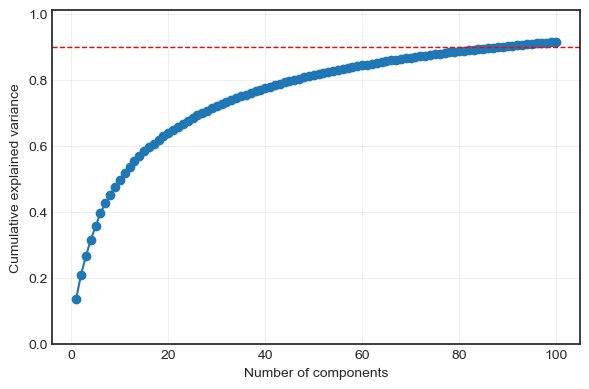

principal component number containing 90% variance:  89


In [106]:
from sklearn.preprocessing import normalize
mat_normalized = normalize(mat, norm='l2')
pca = PCA(n_components=100, random_state= 42).fit(mat_normalized)
cumvar = np.cumsum(pca.explained_variance_ratio_)

plt.figure(figsize=(6,4))
plt.plot(range(1, len(cumvar)+1), cumvar, marker="o")
plt.axhline(0.9, color="r", ls="--", lw=1)  # 可选：90%参考线
plt.xlabel("Number of components")
plt.ylabel("Cumulative explained variance")
plt.ylim(0, 1.01)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print('principal component number containing 90% variance: ',np.argmin(cumvar <= 0.9) + 1)

In [109]:
pca = PCA(n_components=89, random_state= 42)
mat_pca = pca.fit_transform(mat_normalized)

# t-sne

In [119]:
review_df_all_deduplicate

,author_id,rating,is_recommended,helpfulness,total_feedback_count,total_neg_feedback_count,total_pos_feedback_count,submission_time,review_text,review_title,...,hair_color,product_id,product_name,brand_name,price_usd,review_id,submission_year,submission_month,review_text_cleaned,word_vec
877,22934451719,5,1.0,1.000000,2,0,2,2022-08-05,my favorite lip sleeping mask. it feels so goo...,No_review_title,...,black,P420652,Lip Sleeping Mask Intense Hydration with Vitam...,LANEIGE,24.0,877,2022,8,my favorite lip sleeping mask it feels so good...,"[0.0064082495, -0.009081896, 0.09921913, -0.00..."
1586,6293496826,5,1.0,0.285714,7,5,2,2022-02-07,"really nice sunscreen, it hydrated my skin pre...",No_review_title,...,brown,P420652,Lip Sleeping Mask Intense Hydration with Vitam...,LANEIGE,24.0,1585,2022,2,really nice sunscreen it hydrated my skin pret...,"[0.0015307013, 0.006401445, 0.09736306, 0.0144..."
2136,33914299569,5,1.0,0.058823,17,16,1,2021-11-07,the aquaphor healing ointment saves my dry cra...,No_review_title,...,black,P420652,Lip Sleeping Mask Intense Hydration with Vitam...,LANEIGE,24.0,2135,2021,11,the aquaphor healing ointment saves my dry cra...,"[0.0036369187, -0.026116602, 0.101289496, 0.01..."
2498,1960512003,5,1.0,0.666667,3,1,2,2021-08-02,love this sleeping mask!i even had some dark s...,Lips oh so soft,...,brown,P420652,Lip Sleeping Mask Intense Hydration with Vitam...,LANEIGE,24.0,2496,2021,8,love this sleeping mask i even had some dark s...,"[0.0064637405, -0.0027033759, 0.09780822, 0.01..."
2803,8792282096,5,1.0,1.000000,6,0,6,2021-05-26,my favorite lip balm ever. my friends and i ha...,Its like buttah,...,blonde,P420652,Lip Sleeping Mask Intense Hydration with Vitam...,LANEIGE,24.0,2801,2021,5,my favorite lip balm ever my friends and i had...,"[0.007859688, -0.019582404, 0.072640665, -0.00..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
986427,1567381751,5,NaN,NaN,0,0,0,2010-07-16,i love murad products!,No_review_title,...,No_profile,P38217,Renewing Cleansing Cream,Murad,45.0,830411,2010,7,i love murad products,"[0.016343998, -0.007295096, 0.052727528, -0.00..."
988871,6500549788,5,1.0,NaN,0,0,0,2018-04-12,love it! love it! love it!,No_review_title,...,brown,P420143,Clarifying AHA + BHA Mask,Tata Harper,75.0,93908,2018,4,love it love it love it,"[0.01870915, 0.030312225, 0.15989995, 0.020835..."
1012954,1263554114,4,NaN,1.000000,4,0,4,2010-06-01,excellent for dry skin.,No_review_title,...,No_profile,P122651,Clarifying Lotion 1,CLINIQUE,20.0,889413,2010,6,excellent for dry skin,"[0.01332703, -0.02744935, 0.13204333, 0.039624..."
1064336,1901744526,4,1.0,0.600000,5,2,3,2020-11-10,"my skin just looks better, healthier . i’m alm...",No_review_title,...,red,P455622,Even Better Clinical Radical Dark Spot Correct...,CLINIQUE,85.0,939673,2020,11,my skin just looks better healthier i am almos...,"[0.023280203, -0.0136473505, 0.0851843, -0.006..."


In [118]:
review_df_all_deduplicate.iloc[:,:-1].to_csv("D:/MachineLearning/STAT_437_Final_Project/dataset/review_df_all_deduplicate_processed.csv")

In [110]:
%%time
tsne = TSNE(n_components=2, perplexity=50,random_state=42, n_jobs = -1).fit(mat_pca)

CPU times: total: 3h 56min 56s
Wall time: 25min 24s


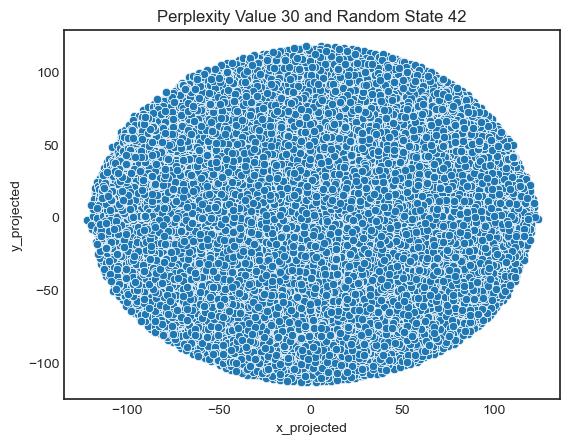

In [113]:
mat_tsne = tsne.embedding_
df_tsne = pd.DataFrame(mat_tsne)

fig, ax = plt.subplots()
sns.scatterplot(x=df_tsne.iloc[:,0], y=df_tsne.iloc[:,1])
ax.set_title(f"Perplexity Value {30} and Random State {42}")
ax.set_xlabel("x_projected")
ax.set_ylabel("y_projected")
#ax.set_xlim([-15, 15])
#ax.set_ylim([-15, 15])
plt.show()

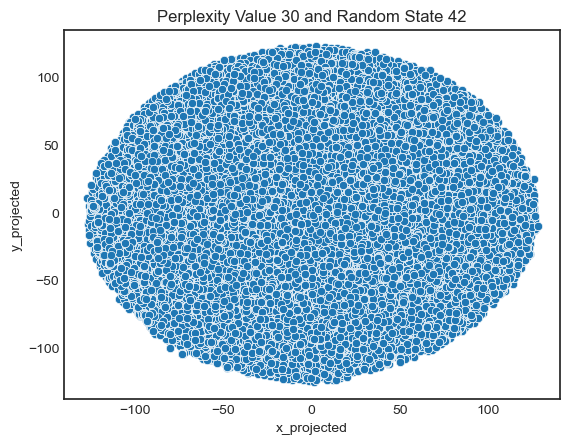

In [105]:
mat_tsne = tsne.embedding_
df_tsne = pd.DataFrame(mat_tsne)

fig, ax = plt.subplots()
sns.scatterplot(x=df_tsne.iloc[:,0], y=df_tsne.iloc[:,1])
ax.set_title(f"Perplexity Value {30} and Random State {42}")
ax.set_xlabel("x_projected")
ax.set_ylabel("y_projected")
#ax.set_xlim([-15, 15])
#ax.set_ylim([-15, 15])
plt.show()

# 尝试 K-means

In [121]:
kmean_label = KMeans(n_clusters=5, random_state=42).fit_predict(mat_pca)

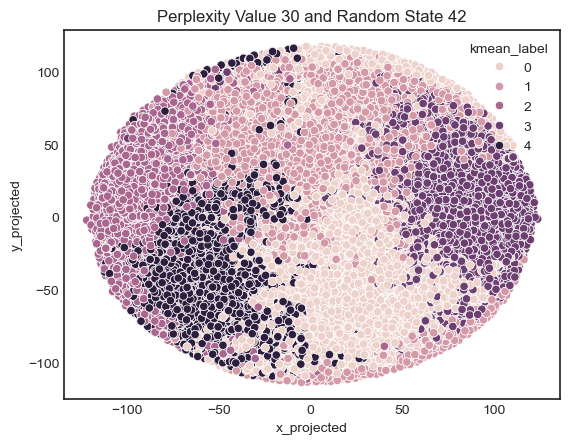

In [124]:
mat_tsne = tsne.embedding_
df_tsne = pd.DataFrame(mat_tsne)
df_tsne['kmean_label'] = kmean_label

fig, ax = plt.subplots()
sns.scatterplot(x=df_tsne.iloc[:,0], y=df_tsne.iloc[:,1], hue=df_tsne['kmean_label'])
ax.set_title(f"Perplexity Value {30} and Random State {42}")
ax.set_xlabel("x_projected")
ax.set_ylabel("y_projected")
#ax.set_xlim([-15, 15])
#ax.set_ylim([-15, 15])
plt.show()

---------------------------------------------------------------------


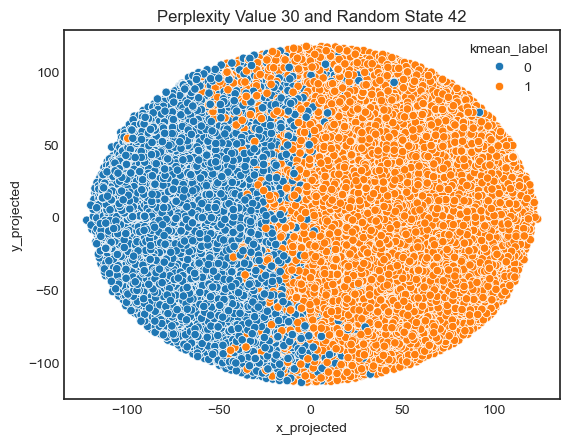

---------------------------------------------------------------------


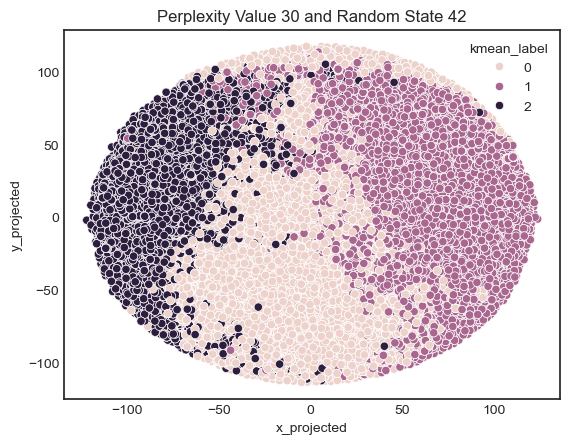

---------------------------------------------------------------------


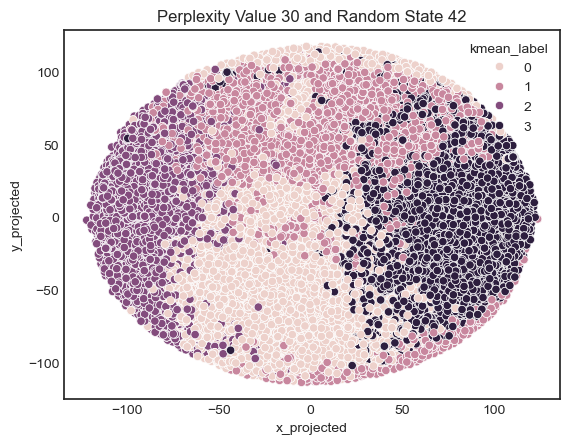

---------------------------------------------------------------------


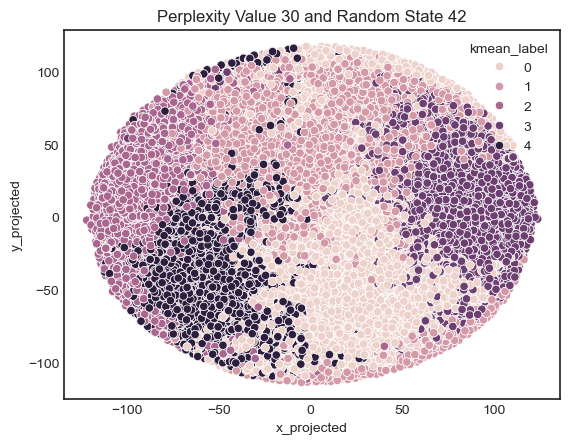

---------------------------------------------------------------------


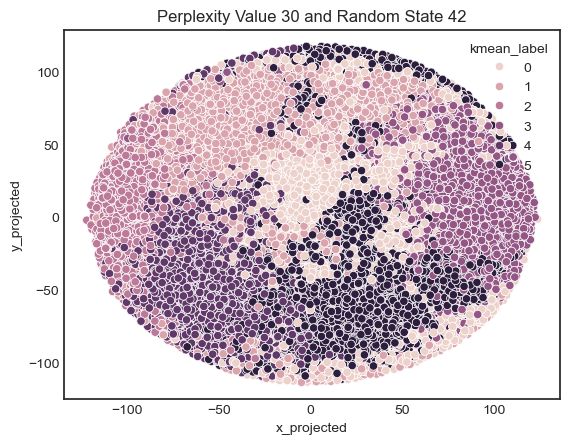

---------------------------------------------------------------------


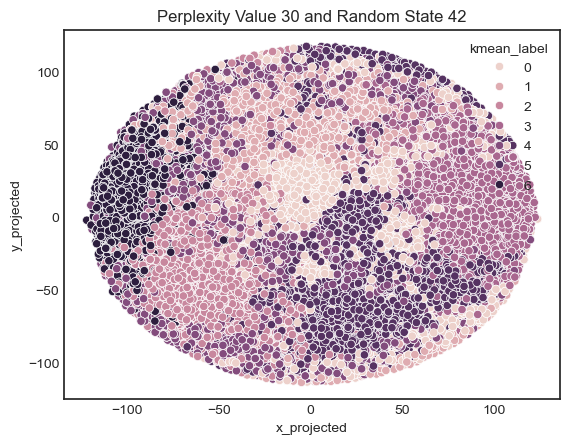

---------------------------------------------------------------------


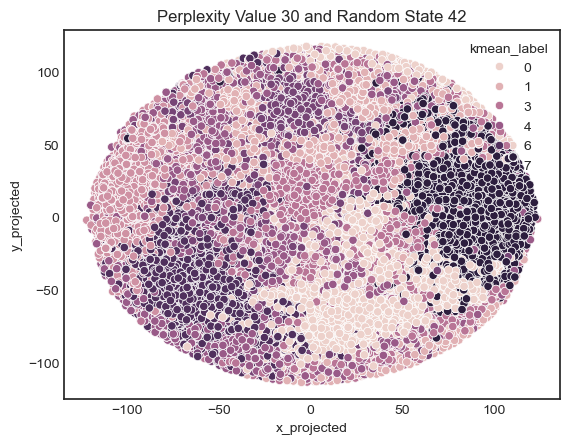

---------------------------------------------------------------------


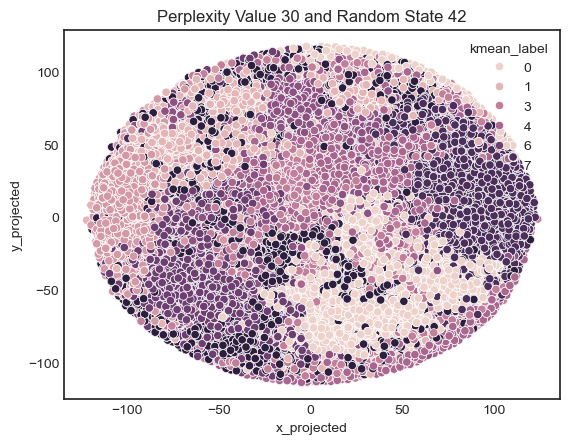

---------------------------------------------------------------------


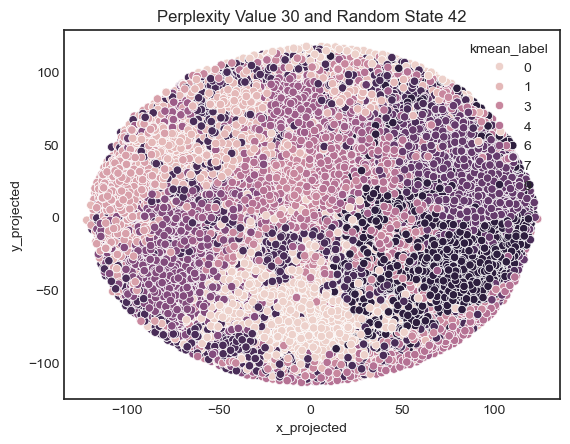

In [126]:
cluster_num = list(range(2, 11))

for num in cluster_num:
    print('---------------------------------------------------------------------')
    kmean_label = KMeans(n_clusters=num, random_state=42).fit_predict(mat_pca)
    df_tsne['kmean_label'] = kmean_label
    
    fig, ax = plt.subplots()
    sns.scatterplot(x=df_tsne.iloc[:,0], y=df_tsne.iloc[:,1], hue=df_tsne['kmean_label'])
    ax.set_title(f"Perplexity Value {30} and Random State {42}")
    ax.set_xlabel("x_projected")
    ax.set_ylabel("y_projected")
#ax.set_xlim([-15, 15])
#ax.set_ylim([-15, 15])
    plt.show()
    

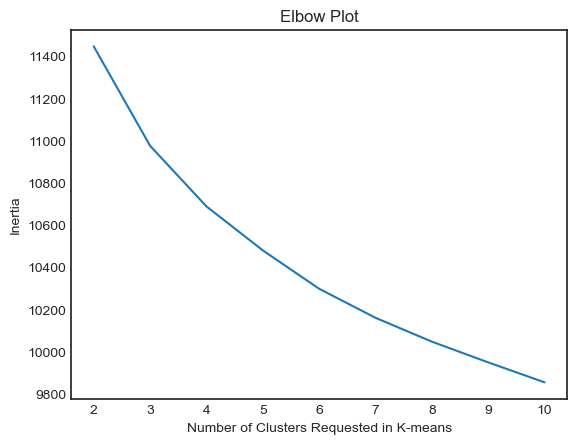

In [128]:
inertia_lis = []
for i in range(2, 11):
    
    kmeans = KMeans(n_clusters= i, random_state=42)
    kmeans.fit(mat_pca)
        
    inertia_lis.append(kmeans.inertia_)


plt.plot(range(2,11), inertia_lis)
plt.xlabel('Number of Clusters Requested in K-means')
plt.ylabel('Inertia')
plt.xticks(range(2,11))
plt.title('Elbow Plot')
plt.show()

# 开始尝试sample

In [139]:
review_df_all_deduplicate.groupby('rating')['rating'].agg(['count']) / review_df_all_deduplicate.shape[0]

,count
rating,
1,0.059749
2,0.051380
3,0.081246
4,0.171728
5,0.635897


In [153]:
from sklearn.model_selection import train_test_split

sample_ratio = 0.02

_, df_sample = train_test_split(
    review_df_all_deduplicate, 
    test_size=sample_ratio, 
    stratify=review_df_all_deduplicate['rating'], 
    random_state=42
)

In [152]:
5000 / review_df_all_deduplicate.shape[0]

0.020717573889227275

In [154]:
mat = np.vstack(df_sample["word_vec"].values)
mat.shape

(4827, 300)

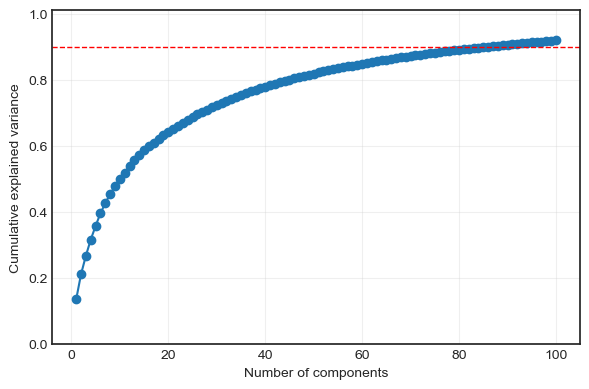

principal component number containing 90% variance:  86


In [155]:
mat_normalized = normalize(mat, norm='l2')
pca = PCA(n_components=100, random_state= 42).fit(mat_normalized)
cumvar = np.cumsum(pca.explained_variance_ratio_)

plt.figure(figsize=(6,4))
plt.plot(range(1, len(cumvar)+1), cumvar, marker="o")
plt.axhline(0.9, color="r", ls="--", lw=1)  # 可选：90%参考线
plt.xlabel("Number of components")
plt.ylabel("Cumulative explained variance")
plt.ylim(0, 1.01)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print('principal component number containing 90% variance: ',np.argmin(cumvar <= 0.9) + 1)

In [156]:
pca = PCA(n_components=88, random_state= 42)
mat_pca = pca.fit_transform(mat_normalized)

In [157]:
%%time
tsne_sample = TSNE(n_components=2, perplexity=50,random_state=42, n_jobs = -1).fit(mat_pca)

CPU times: total: 8min 17s
Wall time: 38.8 s


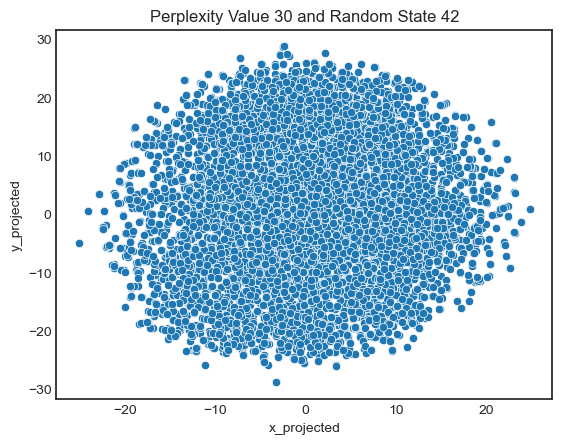

In [158]:
mat_tsne_sample = tsne_sample.embedding_
df_tsne_sample = pd.DataFrame(mat_tsne_sample)

fig, ax = plt.subplots()
sns.scatterplot(x=df_tsne_sample.iloc[:,0], y=df_tsne_sample.iloc[:,1])
ax.set_title(f"Perplexity Value {30} and Random State {42}")
ax.set_xlabel("x_projected")
ax.set_ylabel("y_projected")
plt.show()

# SBERT Embedding

In [25]:
df_sbert = pd.read_csv("D:/MachineLearning/STAT_437_Final_Project/dataset/sbert_embeddings_1.csv", index_col=0)

In [26]:
df_sbert['rating'] = review_df_all_deduplicate['rating']

In [27]:
sample_ratio = 0.043

_, df_sample = train_test_split(
    df_sbert, 
    test_size=sample_ratio, 
    stratify=df_sbert['rating'], 
    random_state=42
)

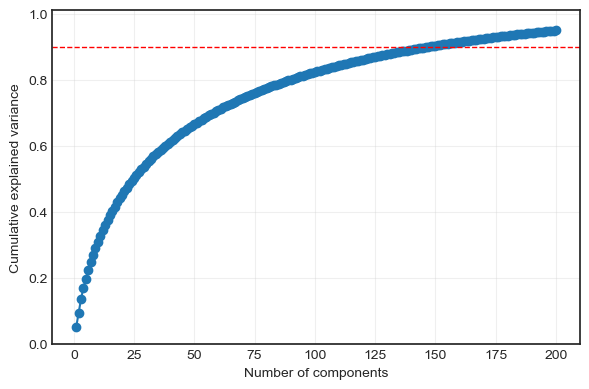

principal component number containing 90% variance:  147


In [28]:
mat = df_sample.iloc[:,:-1].to_numpy()

mat_normalized = normalize(mat, norm='l2')
pca = PCA(n_components=200, random_state= 42).fit(mat_normalized)
cumvar = np.cumsum(pca.explained_variance_ratio_)

plt.figure(figsize=(6,4))
plt.plot(range(1, len(cumvar)+1), cumvar, marker="o")
plt.axhline(0.9, color="r", ls="--", lw=1)  # 可选：90%参考线
plt.xlabel("Number of components")
plt.ylabel("Cumulative explained variance")
plt.ylim(0, 1.01)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print('principal component number containing 90% variance: ',np.argmin(cumvar <= 0.9) + 1)

In [29]:
pca = PCA(n_components=147, random_state= 42)
mat_pca = pca.fit_transform(mat_normalized)

In [30]:
%%time
tsne_sample = TSNE(n_components=2, perplexity=50,random_state=42, n_jobs = -1).fit(mat_pca)

d:\miniconda3\envs\pydata-book\Lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
[WinError 2] 系统找不到指定的文件。
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "d:\miniconda3\envs\pydata-book\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "d:\miniconda3\envs\pydata-book\Lib\subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "d:\miniconda3\envs\pydata-book\Lib\subprocess.py", line 1026, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "d:\miniconda3\envs\pydata-book\Lib\subprocess.py", line 1538, in _execute_child
    hp, ht, pid, tid = _winapi.CreatePro

CPU times: total: 14min 29s
Wall time: 1min 5s


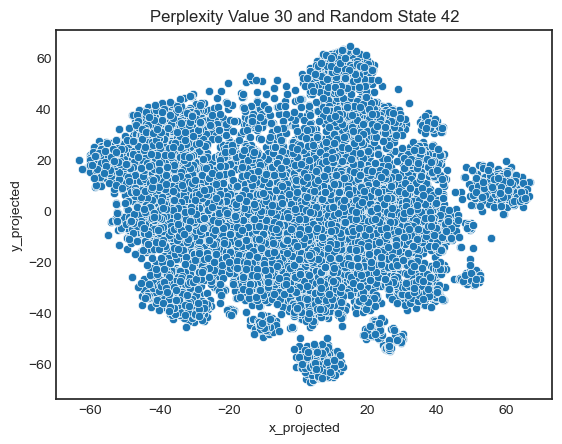

In [31]:
mat_tsne_sample = tsne_sample.embedding_
df_tsne_sample = pd.DataFrame(mat_tsne_sample)

fig, ax = plt.subplots()
sns.scatterplot(x=df_tsne_sample.iloc[:,0], y=df_tsne_sample.iloc[:,1])
ax.set_title(f"Perplexity Value {30} and Random State {42}")
ax.set_xlabel("x_projected")
ax.set_ylabel("y_projected")
plt.show()

---------------------------------------------------------------------


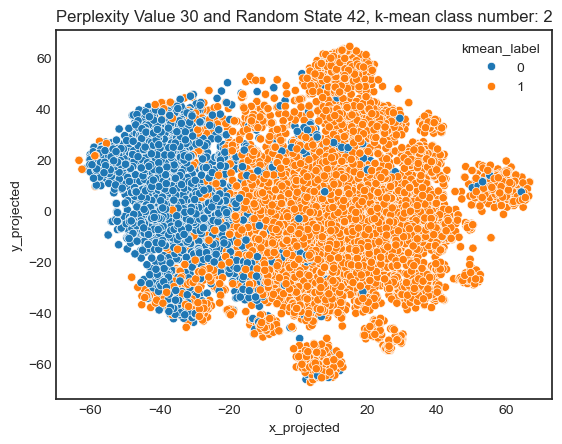

---------------------------------------------------------------------


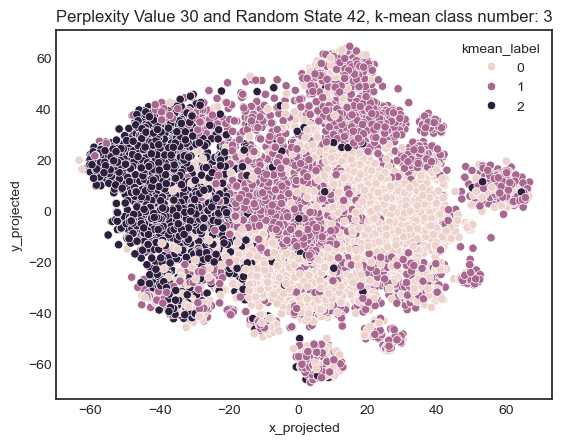

---------------------------------------------------------------------


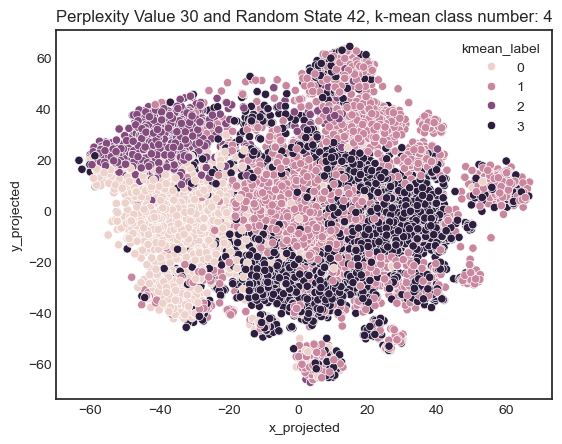

---------------------------------------------------------------------


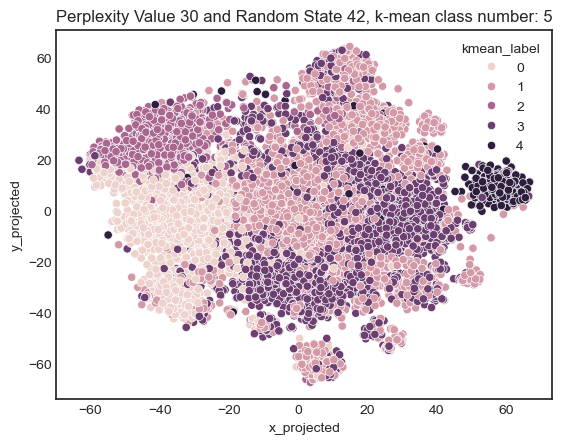

---------------------------------------------------------------------


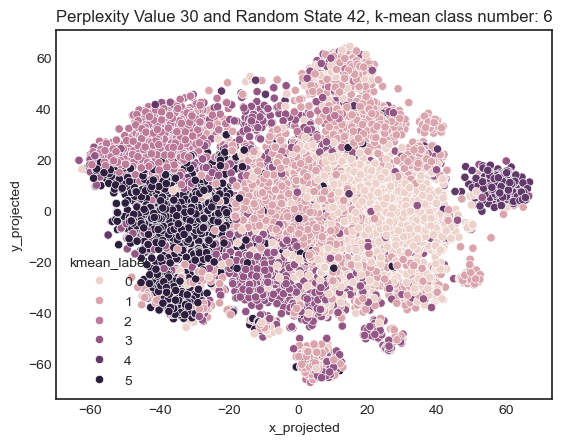

---------------------------------------------------------------------


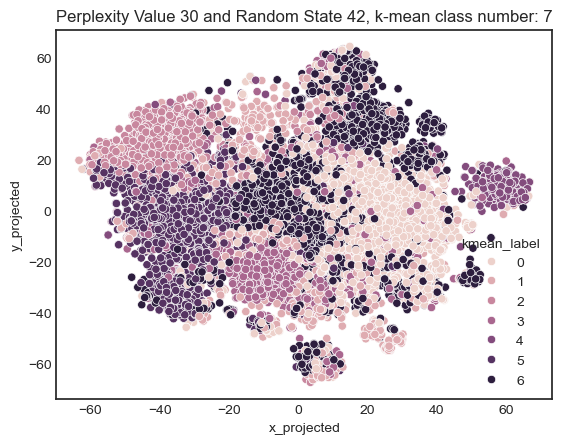

---------------------------------------------------------------------


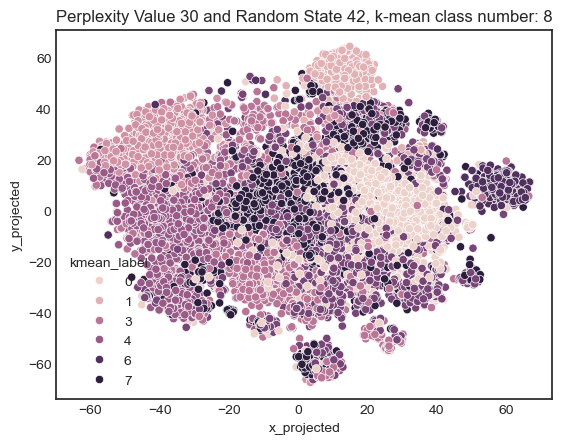

---------------------------------------------------------------------


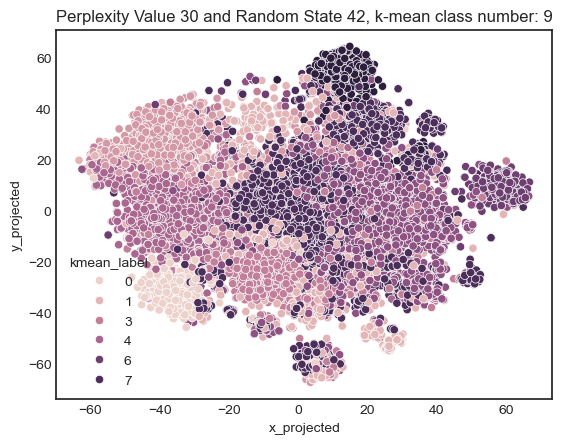

---------------------------------------------------------------------


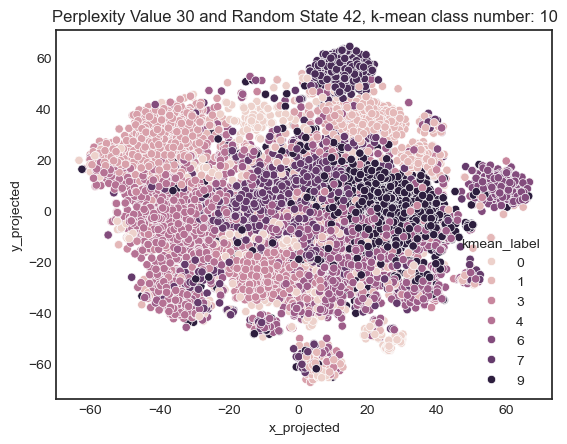

In [33]:
cluster_num = list(range(2, 11))

for num in cluster_num:
    print('---------------------------------------------------------------------')
    kmean_label = KMeans(n_clusters=num, random_state=42).fit_predict(mat_pca)
    df_tsne_sample['kmean_label'] = kmean_label
    
    fig, ax = plt.subplots()
    sns.scatterplot(x=df_tsne_sample.iloc[:,0], y=df_tsne_sample.iloc[:,1], hue=df_tsne_sample['kmean_label'])
    ax.set_title(f"Perplexity Value {30} and Random State {42}, k-mean class number: {num}")
    ax.set_xlabel("x_projected")
    ax.set_ylabel("y_projected")
#ax.set_xlim([-15, 15])
#ax.set_ylim([-15, 15])
    plt.show()
    

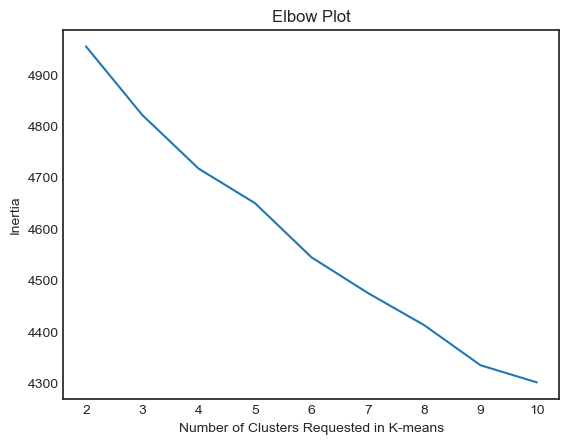

In [34]:
inertia_lis = []
for i in range(2, 11):
    
    kmeans = KMeans(n_clusters= i, random_state=42)
    kmeans.fit(mat_pca)
        
    inertia_lis.append(kmeans.inertia_)


plt.plot(range(2,11), inertia_lis)
plt.xlabel('Number of Clusters Requested in K-means')
plt.ylabel('Inertia')
plt.xticks(range(2,11))
plt.title('Elbow Plot')
plt.show()

In [35]:
from sklearn.metrics import adjusted_rand_score, silhouette_samples, silhouette_score
cluster_num_list=range(2,11)

trial_num=3

avg_sil_score_list=[]
for k in cluster_num_list:

    kmeans=KMeans(n_clusters=k, random_state=42).fit(mat_pca)
        
    cluster_labels = kmeans.labels_
        
    avg_sil_score=silhouette_score(mat_pca, cluster_labels)
        
    avg_sil_score_list.append(avg_sil_score)

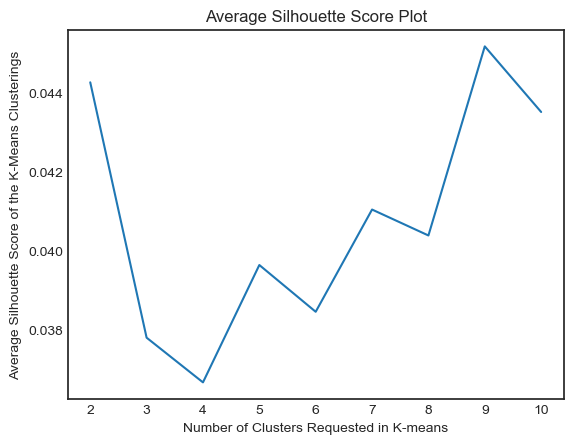

In [36]:
plt.plot(cluster_num_list,avg_sil_score_list)
plt.xlabel('Number of Clusters Requested in K-means')
plt.ylabel('Average Silhouette Score of the K-Means Clusterings')
plt.title('Average Silhouette Score Plot')
plt.show()

cluster sorted matrix

In [ ]:
from scipy.spatial.distance import pdist, squareform

cluster_num_list=range(2,11)

trial_num=3

avg_sil_score_list=[]
for k in cluster_num_list:

    kmeans=KMeans(n_clusters=k, random_state=42).fit(mat_pca)
        
    cluster_labels = kmeans.labels_
    a = df_sample.iloc[:, :-1]
    a['k_mean_label'] = cluster_labels
    a_sorted = a.sort_values(by = ["k_mean_label"])

    print('------------------------------------------------')
    print(a_sorted['k_mean_label'].value_counts())
    
    a_sorted=a_sorted.drop(['k_mean_label'], axis=1)

    dist_mat = squareform(pdist(a_sorted, metric='euclidean'))
    
    fig, ax = plt.subplots(figsize=(10, 8))
    c = ax.pcolormesh(dist_mat, cmap='viridis') # 默认通常是 viridis，也可以试试 'coolwarm'
    
    N = len(a_sorted)
    ax.set_ylim([0, N])
    ax.set_xlim([0, N])
    
    ax.set_title(f"Distance Matrix Sorted by Cluster (K={k})")
    ax.set_xlabel('Data Points (Sorted)')
    ax.set_ylabel('Data Points (Sorted)')
    fig.colorbar(c, ax=ax, shrink=0.8, label='Euclidean Distance')

    plt.show()

------------------------------------------------
k_mean_label
1    7395
0    2983
Name: count, dtype: int64


试下课里面的code

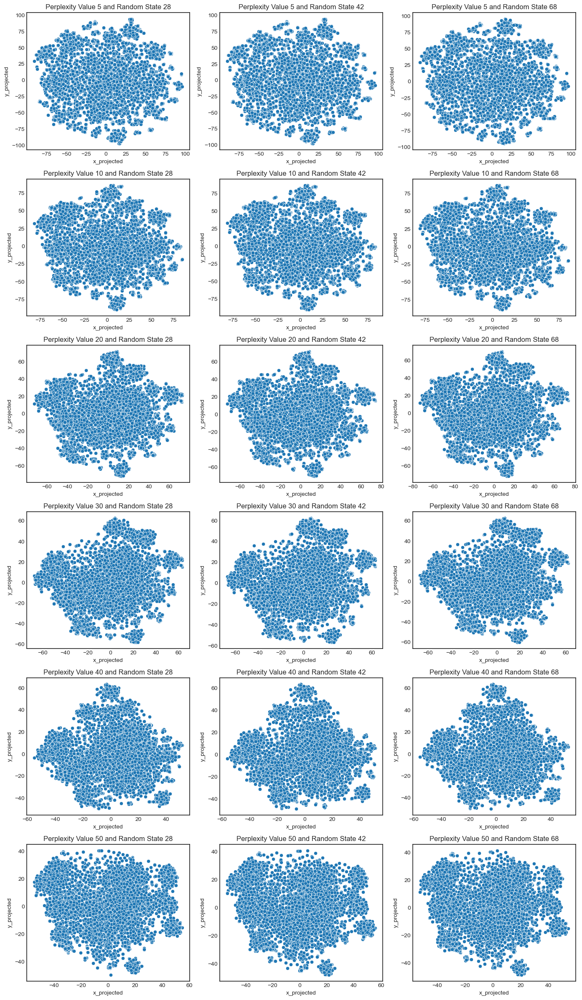

In [197]:
fig, axes = plt.subplots(6,3, figsize = (14, 24))

perpre_lis = [5, 10, 20, 30, 40, 50]
seed_lis = [28, 42, 68]

for i, per_val in enumerate(perpre_lis):

    for j, seed in enumerate(seed_lis):
            
            if per_val == 5:
                 tsne = TSNE(n_components=2, perplexity=per_val, random_state=seed, n_jobs = -1).fit(mat_pca)
                 mat_tsne = tsne.embedding_
                 df_tsne = pd.DataFrame(mat_tsne)

                 sns.scatterplot(x=df_tsne.iloc[:,0], y=df_tsne.iloc[:,1], ax=axes[i,j])

                 axes[i,j].set_title(f"Perplexity Value {per_val} and Random State {seed}")
                 axes[i,j].set_xlabel("x_projected")
                 axes[i,j].set_ylabel("y_projected")

            elif per_val == 10:
                tsne = TSNE(n_components=2, perplexity=per_val, random_state=seed, n_jobs = -1).fit(mat_pca)
                mat_tsne = tsne.embedding_
                df_tsne = pd.DataFrame(mat_tsne)

                sns.scatterplot(x=df_tsne.iloc[:,0], y=df_tsne.iloc[:,1], ax=axes[i,j])

                axes[i,j].set_title(f"Perplexity Value {per_val} and Random State {seed}")
                axes[i,j].set_xlabel("x_projected")
                axes[i,j].set_ylabel("y_projected")
                  

            elif per_val == 20:
                tsne = TSNE(n_components=2, perplexity=per_val, random_state=seed, n_jobs = -1).fit(mat_pca)
                mat_tsne = tsne.embedding_
                df_tsne = pd.DataFrame(mat_tsne)

                sns.scatterplot(x=df_tsne.iloc[:,0], y=df_tsne.iloc[:,1], ax=axes[i,j])

                axes[i,j].set_title(f"Perplexity Value {per_val} and Random State {seed}")
                axes[i,j].set_xlabel("x_projected")
                axes[i,j].set_ylabel("y_projected")


            elif per_val == 30:
                tsne = TSNE(n_components=2, perplexity=per_val, random_state=seed, n_jobs = -1).fit(mat_pca)
                mat_tsne = tsne.embedding_
                df_tsne = pd.DataFrame(mat_tsne)

                sns.scatterplot(x=df_tsne.iloc[:,0], y=df_tsne.iloc[:,1], ax=axes[i,j])

                axes[i,j].set_title(f"Perplexity Value {per_val} and Random State {seed}")
                axes[i,j].set_xlabel("x_projected")
                axes[i,j].set_ylabel("y_projected")

            elif per_val == 40:
                tsne = TSNE(n_components=2, perplexity=per_val, random_state=seed, n_jobs = -1).fit(mat_pca)
                mat_tsne = tsne.embedding_
                df_tsne = pd.DataFrame(mat_tsne)

                sns.scatterplot(x=df_tsne.iloc[:,0], y=df_tsne.iloc[:,1], ax=axes[i,j])

                axes[i,j].set_title(f"Perplexity Value {per_val} and Random State {seed}")
                axes[i,j].set_xlabel("x_projected")
                axes[i,j].set_ylabel("y_projected")
            
            else:
                tsne = TSNE(n_components=2, perplexity=per_val, random_state=seed, n_jobs = -1).fit(mat_pca)
                mat_tsne = tsne.embedding_
                df_tsne = pd.DataFrame(mat_tsne)

                sns.scatterplot(x=df_tsne.iloc[:,0], y=df_tsne.iloc[:,1], ax=axes[i,j])

                axes[i,j].set_title(f"Perplexity Value {per_val} and Random State {seed}")
                axes[i,j].set_xlabel("x_projected")
                axes[i,j].set_ylabel("y_projected")

plt.tight_layout()
plt.show()

# DBSCAN

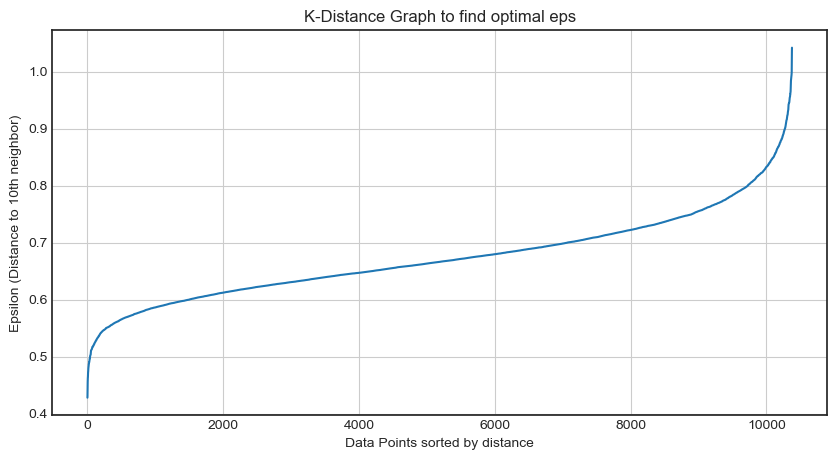

In [118]:
from sklearn.neighbors import NearestNeighbors

min_samples_val = 10

neighbors = NearestNeighbors(n_neighbors=min_samples_val)
neighbors_fit = neighbors.fit(mat_pca)
distances, indices = neighbors_fit.kneighbors(mat_pca)

distances = np.sort(distances[:, min_samples_val-1], axis=0)

plt.figure(figsize=(10, 5))
plt.plot(distances)
plt.title('K-Distance Graph to find optimal eps')
plt.xlabel('Data Points sorted by distance')
plt.ylabel(f'Epsilon (Distance to {min_samples_val}th neighbor)')
plt.grid(True)
plt.show()

In [119]:
from sklearn.cluster import DBSCAN

eps_value = 0.8  # <--- 修改这里！
min_samples_val = 10 # 保持和上面一致

print(f"Starting DBSCAN with eps={eps_value}...")

# n_jobs=-1 表示使用所有 CPU 核心加速
dbscan = DBSCAN(eps=eps_value, min_samples=min_samples_val, metric='euclidean', n_jobs=-1)
labels = dbscan.fit_predict(mat_pca)

Starting DBSCAN with eps=0.8...


In [120]:
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print(f'估计的聚类数量: {n_clusters_}')
print(f'被判定为噪音(Noise)的点数: {n_noise_}')
print(f'噪音占比: {n_noise_ / len(labels) * 100:.2f}%')

# 看看每个 Cluster 有多少人
print("\nCluster 分布情况:")
print(pd.Series(labels).value_counts().sort_index())

估计的聚类数量: 1
被判定为噪音(Noise)的点数: 216
噪音占比: 2.08%

Cluster 分布情况:
-1      216
 0    10162
Name: count, dtype: int64


In [128]:
import hdbscan
min_cluster_size_val = 50

print(f"正在运行 HDBSCAN (min_cluster_size={min_cluster_size_val})...")

clusterer = hdbscan.HDBSCAN(
    min_cluster_size=min_cluster_size_val,
    min_samples=min_samples_val,
    metric='euclidean', 
    gen_min_span_tree=True # 允许画图分析
)

cluster_labels = clusterer.fit_predict(mat_pca)

正在运行 HDBSCAN (min_cluster_size=50)...


In [129]:
set(cluster_labels)

{np.int64(-1)}